In [583]:
# This file is cleaner vrsion of "Dynamic_PsRP_1_1C" file 

In [584]:
# !pip install h5py
# !pip install umap-learn
#!pip install torch

In [585]:
import numpy as np
import pandas as pd
import h5py
import torch
import seaborn as sns
from sklearn.metrics import r2_score, mean_absolute_error, mean_absolute_percentage_error, max_error, classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import zscore
import umap.umap_ as umap
import matplotlib.cm as cm
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

### Analysis of main dataset ("data/data_for_ml.h5")

In [586]:
fn="data/data_for_ml.h5"

In [587]:
#open the file in read mode
with h5py.File('data/data_for_ml.h5', 'r') as f:  
    keys = f.keys() #gives list of the names used in the file

    for key in keys:
        print(key)


DCIR
Dynamic_PsRP_1_1C
Dynamic_PsRP_1_C
Dynamic_PsRP_2_1C
Dynamic_PsRP_2_C
Static_HPPC
Static_PsRP_1
Static_PsRP_2_Chg
Static_PsRP_2_Dis
Static_Rapid


In [588]:
# loading specific data file 
data = pd.read_hdf(fn, key="Dynamic_PsRP_1_1C") # fn = file name and key= specific column we want to open
data

,soc,direction,voltage_0.0s,voltage_1.0s,voltage_2.0s,voltage_3.0s,voltage_4.0s,voltage_5.0s,voltage_6.0s,voltage_7.0s,...,Charge depleting cycle charge throughput,Charge sustaining cycle charge efficiency,Post C/10 charge relaxation fit MSE,Post C/5 charge relaxation fit MSE,Post C/3 charge relaxation fit MSE,Post P/3 charge relaxation fit MSE,Post C/2 charge relaxation fit MSE,Post 1C charge relaxation fit MSE,Thickness growth,Volume growth
0,0.011132,charge,6.799,7.092,7.119,7.142,7.163,6.624,6.608,6.599,...,53.193351,1.254012,0.000015,0.000014,0.000013,0.000013,0.000013,0.000013,NaN,NaN
1,0.172361,charge,7.966,8.200,8.209,8.216,8.222,7.760,7.749,7.742,...,53.193351,1.254012,0.000015,0.000014,0.000013,0.000013,0.000013,0.000013,NaN,NaN
2,0.333591,charge,8.126,8.341,8.350,8.357,8.363,7.936,7.925,7.917,...,53.193351,1.254012,0.000015,0.000014,0.000013,0.000013,0.000013,0.000013,NaN,NaN
3,0.494596,charge,8.288,8.411,8.411,8.410,8.411,8.098,8.089,8.082,...,53.193351,1.254012,0.000015,0.000014,0.000013,0.000013,0.000013,0.000013,NaN,NaN
4,0.644375,charge,8.387,8.408,8.409,8.410,8.410,8.192,8.183,8.177,...,53.193351,1.254012,0.000015,0.000014,0.000013,0.000013,0.000013,0.000013,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4346,0.474158,discharge,3.195,3.289,3.298,3.305,3.310,3.253,3.251,3.251,...,3.105814,1.305203,0.000004,0.000003,0.000101,0.000103,0.001873,0.001283,NaN,NaN
4347,0.387823,discharge,3.178,3.276,3.287,3.295,3.300,3.243,3.241,3.240,...,3.105814,1.305203,0.000004,0.000003,0.000101,0.000103,0.001873,0.001283,NaN,NaN
4348,0.301488,discharge,3.151,3.253,3.267,3.276,3.282,3.225,3.222,3.221,...,3.105814,1.305203,0.000004,0.000003,0.000101,0.000103,0.001873,0.001283,NaN,NaN
4349,0.215153,discharge,3.103,3.213,3.232,3.244,3.253,3.195,3.192,3.191,...,3.105814,1.305203,0.000004,0.000003,0.000101,0.000103,0.001873,0.001283,NaN,NaN


### Creating New Dataset with Desired Featured and Targeted Variables 

"""
==========================
##### For this data set, I am choosing

Feature (X) Variables (Inputs to the model):

            soc
            
            direction_num (numeric version of direction)
            
            All voltage_ns* columns (voltage_0.0s … voltage_120.0s)
            
            All current_ns* columns (current_0.0s … current_120.0s)
            
            temperature_ambient
            
          (Interested in Thickness growth, Volume growth but they have hundereds of missing values. So, make it simpler, initially I decided not to include)

Target (y) Variables (trying to predict):
            
            C/10 discharge capacity
            
            C/5 discharge capacity
            
            C/3 discharge capacity
            
            C/2 discharge capacity
            
            1C discharge capacity
            
            P/3 discharge capacity
==========================

#### """


In [589]:
# making the direction column catorical to numerical 
data['direction_num'] = data['direction'].map({'charge': 1, 'discharge': 0})
print(data['direction_num'])


0       1
1       1
2       1
3       1
4       1
       ..
4346    0
4347    0
4348    0
4349    0
4350    0
Name: direction_num, Length: 4351, dtype: int64


Our initial dataset (data) had two catergorical column, direction and cell_id. To make it easier for the analysis, I decided to make the direction column categorical to numerical. Here, charge = 1 and discharge = 0. And for the cell_id, I decided it keep it as categorical for now. 

In [590]:
# The dataset contained multiple cell_id values corresponding to the same cell type. To group them accordingly, I created a new column 
# called cell_type by extracting the shared identifier from each cell_id.
data['cell_type'] = data['cell_id'].astype(str).str[0]
print(data['cell_type'])

0       B
1       B
2       B
3       B
4       B
       ..
4346    D
4347    D
4348    D
4349    D
4350    D
Name: cell_type, Length: 4351, dtype: object


In [591]:
# Creating new data frame (new_data) combining all the featured (soc, direction_num (numeric version of direction), All voltage_ns* columns 
# (voltage_0.0s … voltage_120.0s), All current_ns* columns (current_0.0s … current_120.0s), temperature_ambient, cell_type (grouped by cell_id) AND 
# targeted variables (C/10 discharge capacity, C/5 discharge capacity, C/3 discharge capacity, C/2 discharge capacity, 1C discharge capacity, 
# P/3 discharge capacity)
######################################################################################
# List of columns dropping
cols_to_drop = [
    'cell_id',
    'Unnamed: 0',
    'measurement_id',
    'direction',
    'Charge depleting cycle charge throughput',
    'Charge sustaining cycle charge efficiency',
    'Post C/10 charge relaxation fit MSE',
    'Post C/5 charge relaxation fit MSE',
    'Post C/3 charge relaxation fit MSE',
    'Post P/3 charge relaxation fit MSE',
    'Post C/2 charge relaxation fit MSE',
    'Post 1C charge relaxation fit MSE',
    'Thickness growth',
    'Volume growth']

# Creating a new DataFrame without those columns
new_data = data.drop(columns=cols_to_drop)

# Checking the shape and first few rows
print(new_data.shape)
print(new_data.head())

(4351, 252)
        soc  voltage_0.0s  voltage_1.0s  voltage_2.0s  voltage_3.0s  \
0  0.011132         6.799         7.092         7.119         7.142   
1  0.172361         7.966         8.200         8.209         8.216   
2  0.333591         8.126         8.341         8.350         8.357   
3  0.494596         8.288         8.411         8.411         8.410   
4  0.644375         8.387         8.408         8.409         8.410   

   voltage_4.0s  voltage_5.0s  voltage_6.0s  voltage_7.0s  voltage_8.0s  ...  \
0         7.163         6.624         6.608         6.599         6.592  ...   
1         8.222         7.760         7.749         7.742         7.737  ...   
2         8.363         7.936         7.925         7.917         7.911  ...   
3         8.411         8.098         8.089         8.082         8.076  ...   
4         8.410         8.192         8.183         8.177         8.172  ...   

   current_120.0s  temperature_ambient  C/10 discharge capacity  \
0          13

##### <span style ="color:darkblue">Initial dataset (data) had 4351 rows × 264 columns and the new dataset (new_data) have 4351 rows × 252 columns</span>

In [592]:
# Checking all the columns name
# print(new_data.columns.tolist())

In [593]:
# data type summery
dtype_counts = new_data.dtypes.value_counts()
print(dtype_counts)
# Getting all columns that are object type
object_cols = new_data.select_dtypes(include='object').columns
print(object_cols.tolist())

float64    250
int64        1
object       1
Name: count, dtype: int64
['cell_type']


# Creating tables based on Cell types

In [594]:
# Getting unique cell types
unique_types = new_data['cell_type'].unique()
print(f"Unique cell types: {unique_types}")

# Counting how many unique types there are
count_types = new_data['cell_type'].nunique()
print(f"Number of unique cell_type values: {count_types}")

# Counting how many rows belong to each cell_type
type_counts = new_data['cell_type'].value_counts()
print("Counts per cell_type:")
print(type_counts)

Unique cell types: ['B' 'A' 'C' 'D']
Number of unique cell_type values: 4
Counts per cell_type:
cell_type
C    1764
D    1300
A     938
B     349
Name: count, dtype: int64


In [595]:
# Creating separate datasets for each cell_type
# new_data_A = new_data[new_data['cell_type'] == 'A']
# new_data_B = new_data[new_data['cell_type'] == 'B']
new_data_C = new_data[new_data['cell_type'] == 'C']
new_data_D = new_data[new_data['cell_type'] == 'D']
# Verifying that the number of rows for each cell_type matches the original dataset
# print(len(new_data_A), len(new_data_B), len(new_data_C), len(new_data_D));
print(new_data_C);
# print(new_data_D)

           soc  voltage_0.0s  voltage_1.0s  voltage_2.0s  voltage_3.0s  \
1287  0.008503         3.082         3.130         3.140         3.149   
1288  0.110753         3.550         3.585         3.586         3.587   
1289  0.213004         3.626         3.660         3.661         3.663   
1290  0.315254         3.687         3.720         3.721         3.722   
1291  0.417505         3.723         3.756         3.757         3.758   
...        ...           ...           ...           ...           ...   
3046  0.605694         3.653         3.845         3.852         3.858   
3047  0.480204         3.567         3.763         3.770         3.775   
3048  0.354714         3.496         3.694         3.701         3.706   
3049  0.229224         3.423         3.624         3.632         3.637   
3050  0.103734         3.259         3.472         3.483         3.492   

      voltage_4.0s  voltage_5.0s  voltage_6.0s  voltage_7.0s  voltage_8.0s  \
1287         3.158         3.082 

# Analysis for Cell C 

In [596]:
# Non-numeric columns can't be used for correlation analysis, so I filtered the dataset to include only numeric features.
# Creating a new DataFrame with numeric columns only for Cell C

numeric_C = new_data_C.select_dtypes(include=['number'])

# for col in numeric_C.columns:
#     print(col)

# Checking the result
# print(numeric_C.head())
# data type summery
dtype_counts = numeric_C.dtypes.value_counts()
print(dtype_counts)
print(numeric_C.shape)

float64    250
int64        1
Name: count, dtype: int64
(1764, 251)


In [597]:
# Cheking summary (mean, std, median, min, max, and quartiles) for Cell C dataset
summary = numeric_C.describe(percentiles=[0.25, 0.5, 0.75]).T
summary = summary[['mean','std', 'max','min', '25%', '50%', '75%']]

print(summary.head())

                  mean       std       max       min      25%       50%  \
soc           0.489315  0.293624  0.991591  0.001119  0.23073  0.485214   
voltage_0.0s  3.712728  0.275675  4.201000  2.695000  3.56200  3.711000   
voltage_1.0s  3.790042  0.264581  4.201000  2.794000  3.64800  3.785000   
voltage_2.0s  3.794489  0.263281  4.201000  2.818000  3.65200  3.787000   
voltage_3.0s  3.797971  0.261869  4.201000  2.840000  3.65500  3.789000   

                   75%  
soc           0.744399  
voltage_0.0s  3.911000  
voltage_1.0s  3.992250  
voltage_2.0s  3.999000  
voltage_3.0s  4.003000  


In [598]:
## To get better visualizations of statistics table
# summary.style.background_gradient(cmap='Blues').format("{:.2f}")

#### Boxplots of discharge capacity at different rates (C/10 to P/3) for Cell-C

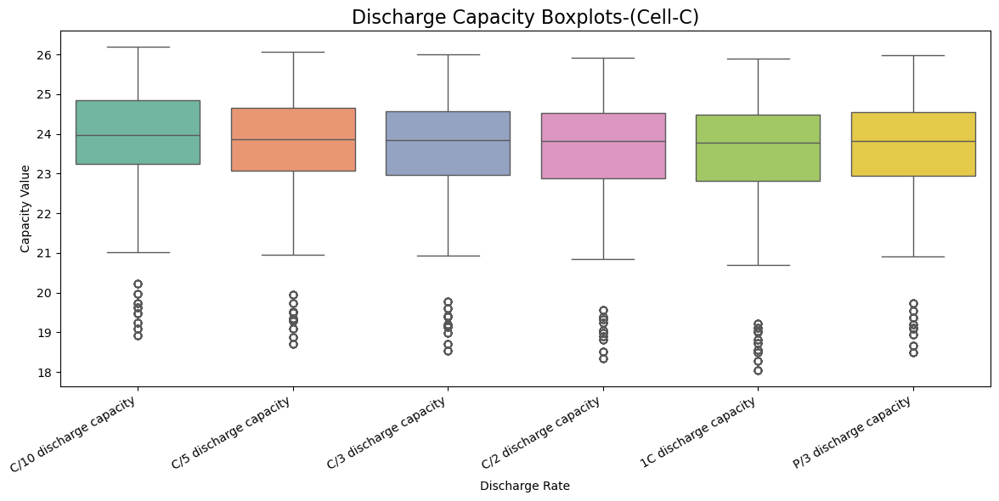

In [599]:
# Here, I wanted to compare the distribution of capacity across the different discharge rates.
# Boxplots shows the median, spread, and presence of outliers for each discharge condition.

target_vars = [
    'C/10 discharge capacity',
    'C/5 discharge capacity',
    'C/3 discharge capacity',
    'C/2 discharge capacity',
    '1C discharge capacity',
    'P/3 discharge capacity']
plt.figure(figsize=(12,6))

# boxplot
sns.boxplot(data=numeric_C[target_vars],palette='Set2')

plt.title("Discharge Capacity Boxplots-(Cell-C)", fontsize=16)
plt.xlabel("Discharge Rate")
plt.ylabel("Capacity Value")
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

The results show that the battery delivers more energy when discharged slowly and less energy when discharged quickly. At low discharge rates, the cell provides nearly its full capacity, but as the rate increases, the available capacity drops noticeably. This means that while the battery is well-suited for low-power applications that draw energy gradually, it will provide shorter runtimes in high-power applications that demand fast discharge.

#### Histograms  of discharge capacity at different rates (C/10 to P/3) for Cell‑C 

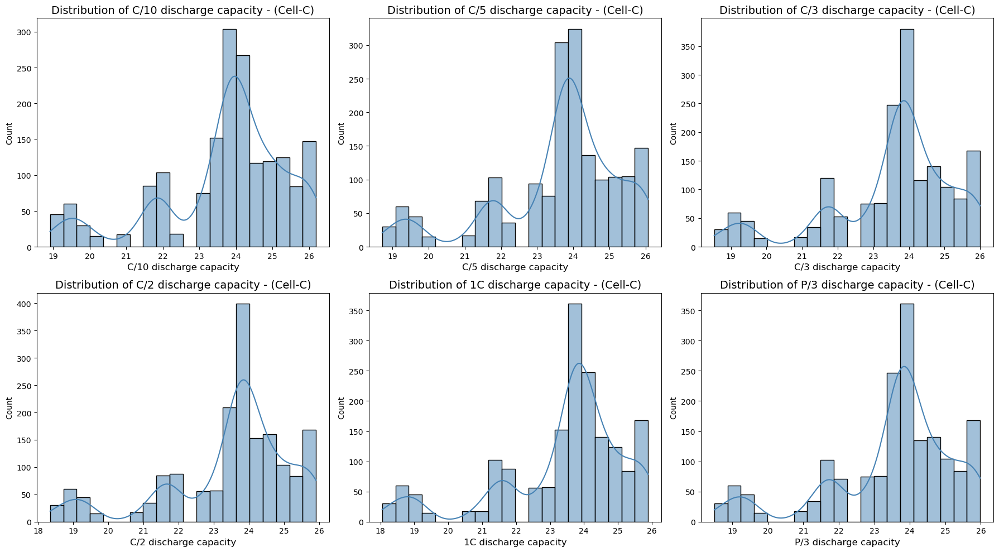

In [600]:
# In this step, I plotted histograms of the discharge capacity at different C-rates (C/10, C/5, C/3, C/2, 1C, and P/3) for Cell‑C. The goal was to 
# visualize the distribution of capacities at each discharge rate and show how frequently different capacity values occur. I also included kernel density 
# estimates (KDE)to show the overall shape and spread of the data.
    
# List of the target variables
target_vars = [
    'C/10 discharge capacity',
    'C/5 discharge capacity',
    'C/3 discharge capacity',
    'C/2 discharge capacity',
    '1C discharge capacity',
    'P/3 discharge capacity'
]

# Creating subplots: 2 rows × 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

# histogram
for i, var in enumerate(target_vars):
    sns.histplot(data=numeric_C, x=var, bins=20, kde=True, color='steelblue', ax=axes[i])
    # Add "Cell -C" to the title
    axes[i].set_title(f'Distribution of {var} - (Cell-C)', fontsize=14)
    axes[i].set_xlabel(var, fontsize=12)
    axes[i].set_ylabel("Count")

plt.tight_layout()
plt.show()

The analysis shows that Cell‑C has higher discharge capacity at lower C‑rates (slow discharge) and lower capacity at higher C‑rates (fast discharge). At C/10, the cell provides nearly full capacity, while at 1C and above, the available capacity drops significantly. This show slower discharge allows more energy to be extracted, while faster discharge reduces usable capacity.

#### Boxplots summarizing the distribution of ambient temperature and state of charge (SOC) for Cell‑C

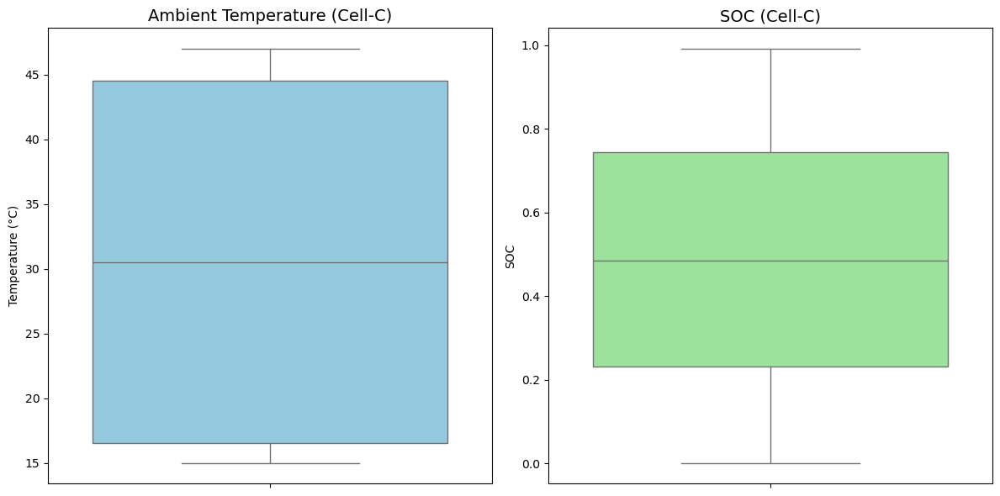

In [601]:
# In this step, I created side‑by‑side boxplots to show the distribution of ambient temperature and state of charge (SOC) for Cell‑C. These plots 
#summarize the spread, median, and any outliers in each variable, making it easy to compare their variability and typical ranges.
    
# Creating side-by-side boxplots
fig, axes = plt.subplots(1, 2, figsize=(12,6))

# Boxplot for temperature_ambient
sns.boxplot(y=numeric_C['temperature_ambient'], color='skyblue', ax=axes[0])
axes[0].set_title("Ambient Temperature (Cell-C)", fontsize=14)
axes[0].set_ylabel("Temperature (°C)")

# Boxplot for soc
sns.boxplot(y=numeric_C['soc'], color='lightgreen', ax=axes[1])
axes[1].set_title("SOC (Cell-C)", fontsize=14)
axes[1].set_ylabel("SOC")

plt.tight_layout()
plt.show()

The ambient temperature for Cell‑C ranges from about 15 °C to 47 °C, with a median around 31 °C. The interquartile range, middle 50% of values fall between roughly 22 °C and 38 °C. Seems like that the cell was tested under a moderate to warm environment, with some measurements at both cooler (15 °C) and hotter extremes (47 °C).
The SOC values for Cell‑C ranges from 0 to 1, with a median around 0.5. The interquartile range, middle 50% of values fall between 0.3 and 0.7 and shows that most of the SOC values falls around mid‑range levels. I think SOC at 0  indicate fully discharged states and SOC at 1 indicates fully charged states. From, the SOC distribution seems like cell C was tested under a different range of charging conditions not just at one fixed level.

#### Boxplots comparing ambient temperature and SOC for Cell‑C under discharge and charge conditions

C:\Users\uhabiba\AppData\Local\Temp\1\ipykernel_41044\2256139660.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=numeric_C,x='direction_num',y='temperature_ambient',ax=axes[0],palette="Set2")
C:\Users\uhabiba\AppData\Local\Temp\1\ipykernel_41044\2256139660.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(["Discharge (0)", "Charge (1)"])
C:\Users\uhabiba\AppData\Local\Temp\1\ipykernel_41044\2256139660.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=numeric_C,x='direction_num',y='soc',ax=axes[1],palette="Set2")
C:\Users\uhabiba\AppData\Local\Temp\1\ipykernel_4104

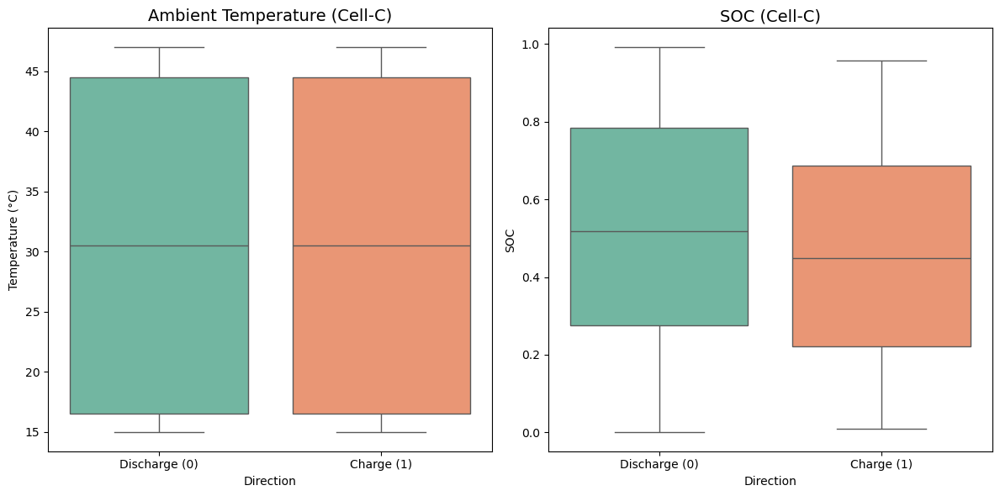

In [602]:
# Here, I wanted to see if there are any differences in the distributions of the ambient temperature and SOC depending on whether the cell is
# charging or discharging.

# Creating side-by-side boxplots
fig, axes = plt.subplots(1, 2, figsize=(12,6))

# Boxplot for temperature_ambient
sns.boxplot(data=numeric_C,x='direction_num',y='temperature_ambient',ax=axes[0],palette="Set2")
axes[0].set_title("Ambient Temperature (Cell-C)", fontsize=14)
axes[0].set_xlabel("Direction")
axes[0].set_ylabel("Temperature (°C)")
axes[0].set_xticklabels(["Discharge (0)", "Charge (1)"]) 

# Boxplot for soc
sns.boxplot(data=numeric_C,x='direction_num',y='soc',ax=axes[1],palette="Set2")
axes[1].set_title("SOC (Cell-C)", fontsize=14)
axes[1].set_xlabel("Direction")
axes[1].set_ylabel("SOC")
axes[1].set_xticklabels(["Discharge (0)", "Charge (1)"]) 

plt.tight_layout()
plt.show()

For the Ambient Temperature (Cell‑C) graph, the temperature ranges are broadly similar for both discharge and charge, falls between 15 °C to 47 °C, with a median around 31 °C. This shows that the cell was tested under comparable environmental conditions in both directions.

For the SOC (Cell‑C)gaph, the SOC distribution differs between discharge and charge. During discharge, the SOC values are generally higher, median closer to mid‑range, while during charge, the SOC values are lower on average. I think this is expected behavior, the SOC decreases as the cell discharges and SOC increases during charging cycles.

#### Histograms of ambient temperature and SOC values for Cell‑C

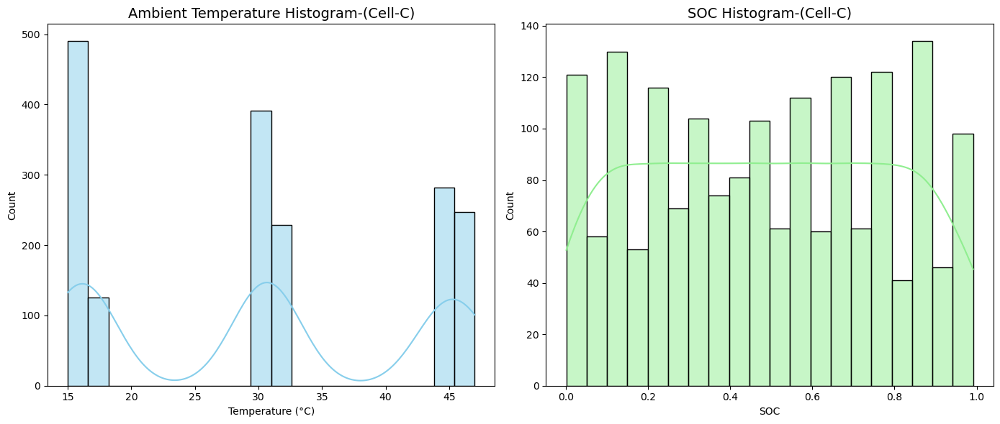

In [603]:
# In this step, I plotted side‑by‑side histograms for Cell‑C, one showing the distribution of ambient temperature values and the other showing the 
# distribution of state of charge (SOC) values.The goal was to see how frequently different values occur and whether the data is concentrated in certain
# ranges or spread out. I also included kernel density estimates (KDE)to show the overall shape and and the distribution of the data. 

# Creating side-by-side histograms
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# Histogram for temperature_ambient
sns.histplot(data=numeric_C, x='temperature_ambient', bins=20, kde=True, color='skyblue', ax=axes[0])
axes[0].set_title("Ambient Temperature Histogram-(Cell-C)", fontsize=14)
axes[0].set_xlabel("Temperature (°C)")
axes[0].set_ylabel("Count")

# Histogram for soc
sns.histplot(data=numeric_C,x='soc',bins=20,kde=True, color='lightgreen', ax=axes[1])
axes[1].set_title("SOC Histogram-(Cell-C)", fontsize=14)
axes[1].set_xlabel("SOC")
axes[1].set_ylabel("Count")

plt.tight_layout()
plt.show()

For the Ambient Temperature Histogram-(Cell-C) graph,the temperature values falls between 15 °C to 47 °C, with most measurements clustering around the mid‑20s to low‑30s °C. The distribution suggests that the cell was typically tested under moderate to warm conditions, with fewer instances at the cooler and hotter extremes.

For the SOC Histogram-(Cell-C) graph, the SOC values span the full range from 0, fully discharge to 1, fully charged, but the distribution is concentrated around the middle range (0.3–0.7). This indicates that the cell was most often observed in partially charged states, while fully charged or fully discharged states were less frequent.

#### Scatter plot of ambient temperature versus SOC for Cell‑C

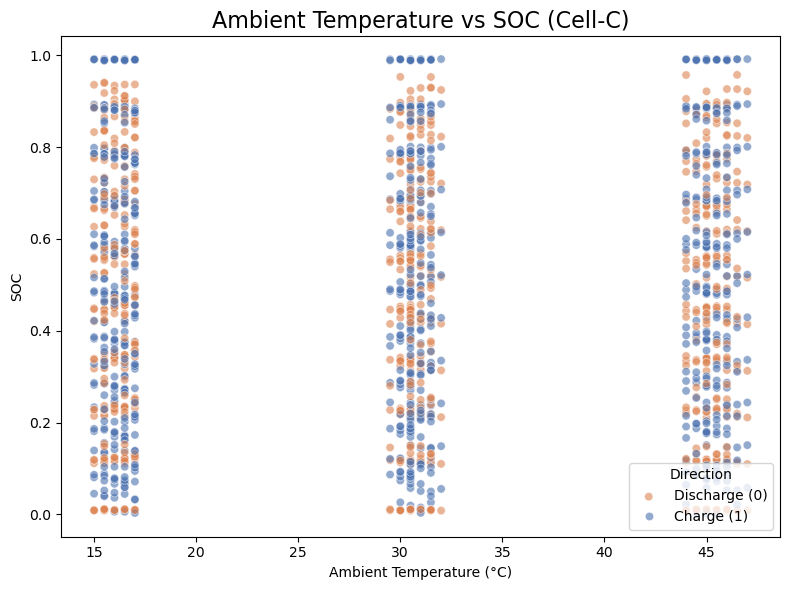

In [604]:
# Here I wanted to see the relationship between ambient temperature and SOC, and to compare how this relationship differs during charging vs discharging
plt.figure(figsize=(8,6))
sns.scatterplot(data=new_data_C, x='temperature_ambient', y='soc', hue='direction_num',palette={0: '#4C72B0', 1: '#DD8452'},alpha=0.6)

plt.title("Ambient Temperature vs SOC (Cell-C)", fontsize=16)
plt.xlabel("Ambient Temperature (°C)")
plt.ylabel("SOC")
plt.legend(title="Direction", labels=["Discharge (0)", "Charge (1)"])
plt.tight_layout()
plt.show()

#### Voltage traces over time for Cell‑C 

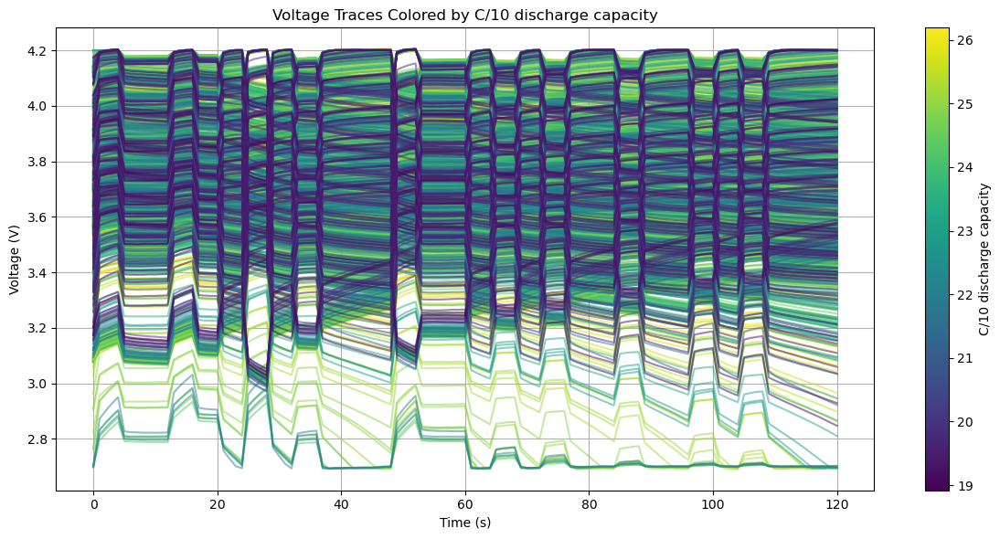

In [605]:
# Here, I wanted to visualize how the pulse data, (for this section I choose voltage over time) evolves, and how that evolution
# differs depending on the discharge capacity.

import matplotlib.cm as cm

# Choosing voltage columns and time
voltage_columns = [col for col in numeric_C.columns if col.startswith('voltage_')]
voltage_times = [float(col.split('_')[1].replace('s', '')) for col in voltage_columns]
sorted_indices = np.argsort(voltage_times)
sorted_voltage_columns = [voltage_columns[i] for i in sorted_indices]
sorted_voltage_times = [voltage_times[i] for i in sorted_indices]

# Choosing a target variable 
target_variable = 'C/10 discharge capacity'
target_values = new_data_C[target_variable]

# Normalizing target values for color mapping
norm = plt.Normalize(target_values.min(), target_values.max())
cmap = cm.viridis  

# Creating figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot each voltage trace
for i in range(len(numeric_C)):
    voltage_trace = numeric_C.iloc[i][sorted_voltage_columns].values
    color = cmap(norm(target_values.iloc[i]))
    ax.plot(sorted_voltage_times, voltage_trace, color=color, alpha=0.5)

# Adding colorbar linked to the same axis
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label(target_variable)

# Labels and title
ax.set_title(f'Voltage Traces Colored by {target_variable}')
ax.set_xlabel('Time (s)')
ax.set_ylabel('Voltage (V)')
ax.grid(True)
plt.tight_layout()
plt.show()


#### Voltage traces over time for Cell‑C at different discharge rates (target variables)

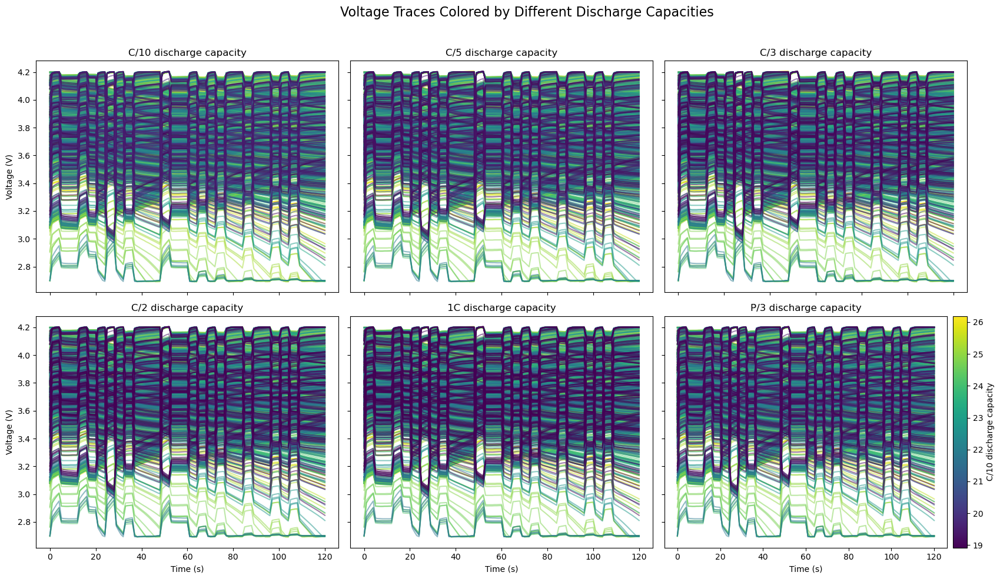

In [606]:
# Here I wanted to visualize how voltage behavior during pulse tests changes across different discharge rates and to compare patterns between them.
target_variables = [
    'C/10 discharge capacity',
    'C/5 discharge capacity',
    'C/3 discharge capacity',
    'C/2 discharge capacity',
    '1C discharge capacity',
    'P/3 discharge capacity']

# Setting up subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.flatten()

# Choosing voltage columns and time
voltage_columns = [col for col in numeric_C.columns if col.startswith('voltage_')]
voltage_times = [float(col.split('_')[1].replace('s', '')) for col in voltage_columns]
sorted_indices = np.argsort(voltage_times)
sorted_voltage_columns = [voltage_columns[i] for i in sorted_indices]
sorted_voltage_times = [voltage_times[i] for i in sorted_indices]

# Using the first target variable to define color scale, shared across all subplots
reference_target = new_data_C[target_variables[0]]
norm = plt.Normalize(reference_target.min(), reference_target.max())
cmap = cm.viridis

# Plotting each subplot
for i, target_variable in enumerate(target_variables):
    ax = axes[i]
    target_values = new_data_C[target_variable]

    for j in range(len(numeric_C)):
        voltage_trace = numeric_C.iloc[j][sorted_voltage_columns].values
        color = cmap(norm(target_values.iloc[j]))  # Use shared norm for consistent color scale
        ax.plot(sorted_voltage_times, voltage_trace, color=color, alpha=0.5)

    ax.set_title(target_variable)
    if i % 3 == 0:
        ax.set_ylabel('Voltage (V)')
    if i >= 3:
        ax.set_xlabel('Time (s)')

# Adding a colorbar on the right side of the figure
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Adding axis 
divider = make_axes_locatable(axes[-1])
cax = divider.append_axes("right", size="5%", pad=0.1)

sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
fig.colorbar(sm, cax=cax, label=target_variables[0])  # Labelling with the first target variable

plt.suptitle('Voltage Traces Colored by Different Discharge Capacities', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.96]) 
plt.show()


# PCA for Cell type C

Number of components chosen: 4
Explained variance ratio: [0.47753568 0.28988615 0.16981939 0.02489446]


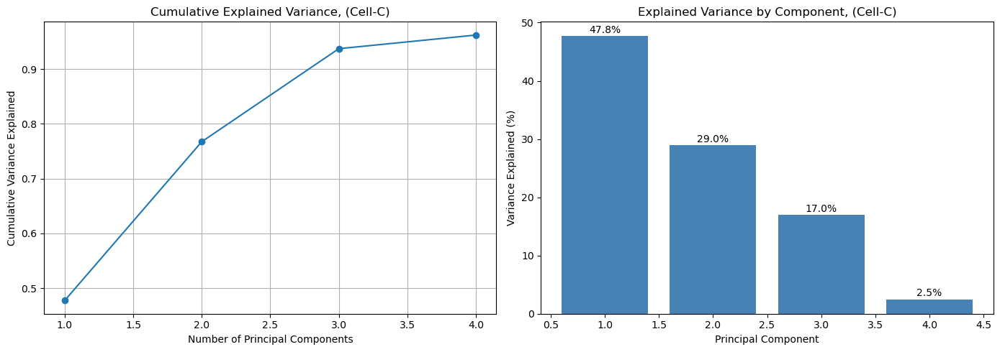

In [607]:
# Standardizing or scalling the data (important for PCA)
scaler = StandardScaler()
numeric_C_scaled = scaler.fit_transform(numeric_C)

# Fitting PCA to retain 95% of variance
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(numeric_C_scaled )

print("Number of components chosen:", pca.n_components_)
print("Explained variance ratio:", pca.explained_variance_ratio_)

# Explained variance ratios
explained_var = pca.explained_variance_ratio_

# Creating subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Cumulative explained variance (line plot)
axes[0].plot(range(1, len(explained_var)+1), np.cumsum(explained_var), marker='o', linestyle='-')
axes[0].set_title('Cumulative Explained Variance, (Cell-C)')
axes[0].set_xlabel('Number of Principal Components')
axes[0].set_ylabel('Cumulative Variance Explained')
axes[0].grid(True)

#Plot 2: Individual explained variance (bar plot) 
axes[1].bar(range(1, len(explained_var)+1), explained_var * 100, color='steelblue')
axes[1].set_title('Explained Variance by Component, (Cell-C)')
axes[1].set_xlabel('Principal Component')
axes[1].set_ylabel('Variance Explained (%)')

# Adding percentage labels on top of bars
for i, v in enumerate(explained_var * 100, start=1):
    axes[1].text(i, v + 0.5, f"{v:.1f}%", ha='center')

plt.tight_layout()
plt.show()

#### Top 10 features contributing to the PC1 -PC4

In [608]:
## Trying to see which features drive each PC:

# Use the original column names from numeric_C
loadings = pd.DataFrame(pca.components_.T, index=numeric_C.columns,columns=[f'PC{i+1}' for i in range(pca.n_components_)])

# Show top 10 features contributing most to PC1, PC2, PC3, and PC4
top_loadings = (loadings[['PC1', 'PC2', 'PC3', 'PC4']].abs(). sort_values(by='PC1', ascending=False).head(10))

print(top_loadings)


                    PC1       PC2       PC3       PC4
voltage_47.0s  0.091244  0.000525  0.000108  0.006983
voltage_48.0s  0.091243  0.000191  0.000124  0.006689
voltage_46.0s  0.091239  0.001277  0.000081  0.007287
voltage_45.0s  0.091228  0.002052  0.000041  0.007594
voltage_72.0s  0.091224  0.000884  0.000186  0.006597
voltage_71.0s  0.091224  0.001919  0.000160  0.006933
voltage_70.0s  0.091211  0.003125  0.000128  0.007345
voltage_44.0s  0.091211  0.002847  0.000009  0.007921
voltage_78.0s  0.091210  0.000746  0.000224  0.006361
voltage_77.0s  0.091208  0.002246  0.000200  0.006777


Here, we can see that the top 10 features contributing to first principal component, PC1 is almost entirely driven by voltage measurements between 44–48 seconds, 70–72 seconds, and 77–78 seconds. Their loadings are very similar (around 0.091) which means PC1 is dominated by voltage behavior across these time intervals.

But, these features contribute very little to PC2, PC3, and PC4 (almost close to zero), this indicates that these voltage features are not strongly influencing the PC2, PC3, and PC4, which are likely shaped by other variables (may be SOC, temperature, or later voltage points not shown in this top 10 list).

### Bar chart of the top 10 voltage features contributing to PC1–PC4

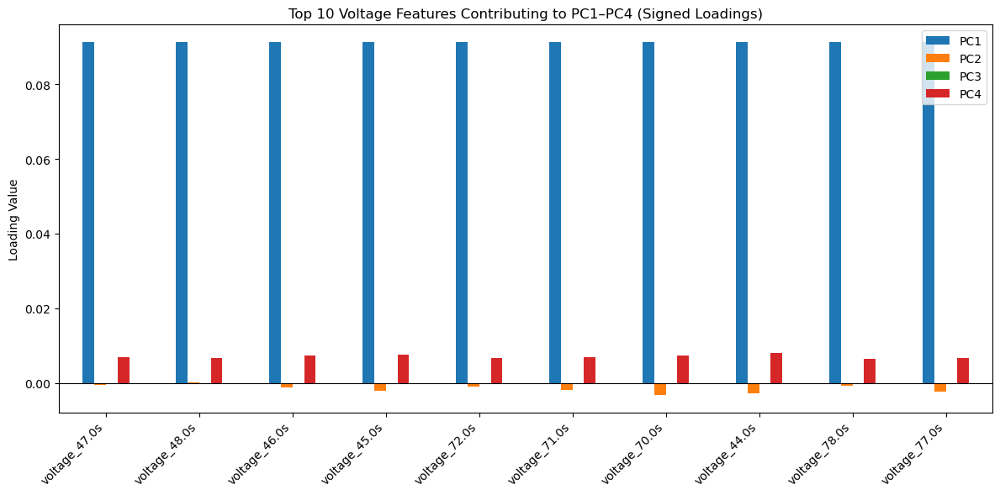

In [609]:
# Here, I wanted to see how the top 10 voltage features that contribute to PC1, PC2, PC3, and PC4 and in what direction (positive or negative).

# Filtering voltage columns 
voltage_columns = [col for col in numeric_C.columns if col.startswith('voltage_')]

# Subseting the loadings - Keeping only the loadings for voltage columns
voltage_loadings = loadings.loc[voltage_columns, ['PC1','PC2','PC3','PC4']]

# Getting the top 10 voltages 
top_voltage_features = (voltage_loadings.abs().max(axis=1).sort_values(ascending=False).head(10).index)
top_voltage_loadings_signed = voltage_loadings.loc[top_voltage_features]

# Bar plot
top_voltage_loadings_signed.plot(kind='bar', figsize=(12,6))
plt.title("Top 10 Voltage Features Contributing to PC1–PC4 (Signed Loadings)")
plt.ylabel("Loading Value")
plt.xticks(rotation=45, ha='right')
plt.axhline(0, color='black', linewidth=0.8)
plt.tight_layout()
plt.show()

### Bar chart of the top 10 current features contributing to PC1–PC4

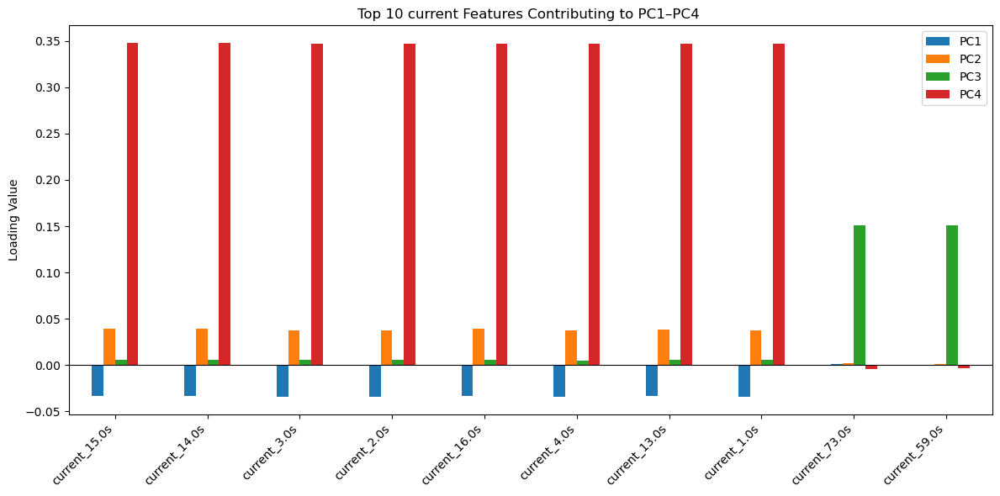

In [610]:
# Here, I wanted to see how the top 10 current features that contribute to PC1, PC2, PC3, and PC4 and in what direction (positive or negative).

# Filtering current columns 
current_columns = [col for col in numeric_C.columns if col.startswith('current_')]

# Subseting the loadings - Keeping only the loadings for current columns
current_loadings = loadings.loc[current_columns, ['PC1','PC2','PC3','PC4']]

# Getting the top 10 current 
top_current_features = (current_loadings.abs().max(axis=1).sort_values(ascending=False).head(10).index)
top_current_loadings_signed = current_loadings.loc[top_current_features]

# Bar plot
top_current_loadings_signed.plot(kind='bar', figsize=(12,6))
plt.title("Top 10 current Features Contributing to PC1–PC4 ")
plt.ylabel("Loading Value")
plt.xticks(rotation=45, ha='right')
plt.axhline(0, color='black', linewidth=0.8)
plt.tight_layout()
plt.show()

#### Bar chart of PCA (voltage) loadings for PC1–PC4 at 10‑second intervals 

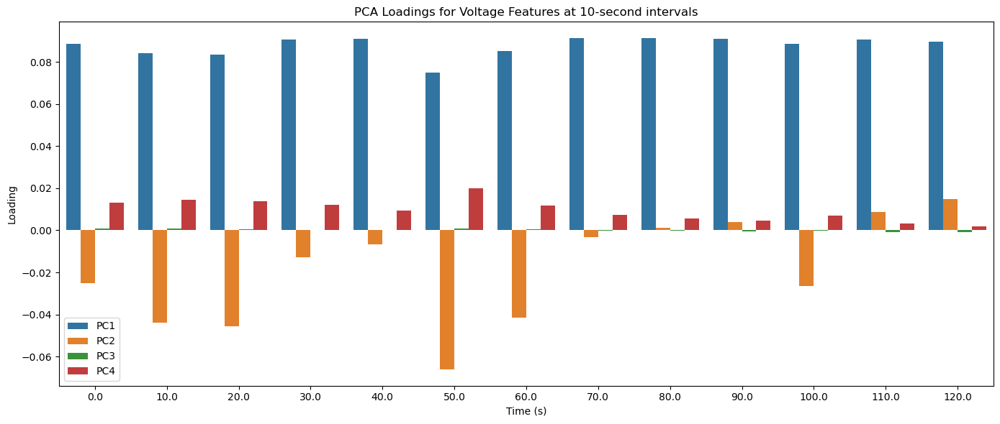

In [611]:
# Here, I wanted to see how the PC1, PC2, PC3, and PC4 varies at specific time intervals, so it will be easier to see which PCs dominate at
# different stages of the voltage trace.
# For this step, I downsamples the PCA loadings to every 10 seconds instead of plotting every single one

# Extracting loadings for PC1–PC4 for voltage features

pc_voltage_loadings = loadings.loc[voltage_columns, ['PC1', 'PC2', 'PC3', 'PC4']]

# Sortting by time 

pc_voltage_loadings['time'] = voltage_times 
pc_voltage_loadings = pc_voltage_loadings.sort_values(by='time')

# Downsample to every 10 seconds
mask = pc_voltage_loadings['time'] % 10 == 0
subset = pc_voltage_loadings[mask]

subset_melted = subset.melt(id_vars='time', var_name='PC', value_name='Loading')

plt.figure(figsize=(14, 6))
sns.barplot(data=subset_melted, x='time', y='Loading', hue='PC')
plt.title('PCA Loadings for Voltage Features at 10‑second intervals')
plt.xlabel('Time (s)')
plt.ylabel('Loading')
plt.legend()
plt.tight_layout()
plt.show()

Here, I am not sure, why it showing PC3 contributing less than PC4. May be beacause how I downsampled for for 10 seconds and it may have hidden the strongest features for PC3.

#### Bar chart of PCA (current) loadings for PC1–PC4 at 10‑second intervals 

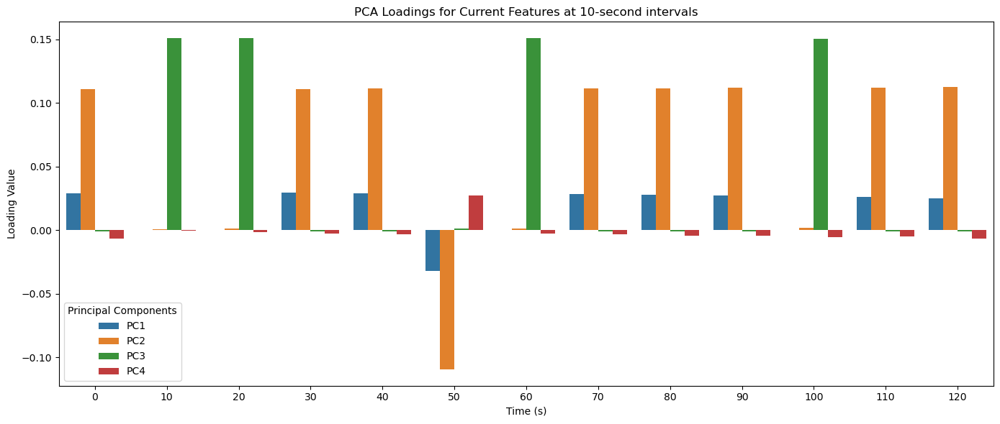

In [612]:
# Here, I wanted to see how the PC1, PC2, PC3, and PC4 varies at specific time intervals, so it will be easier to see which PCs dominate at
# different stages of the voltage trace.
# For this step, I downsamples the PCA loadings to every 10 seconds instead of plotting every single one

import re

# Filtering current columns
current_columns = [col for col in numeric_C.columns if col.startswith('current_')]

# Extracting loadings for PC1–PC4 for current features
pc_current_loadings = loadings.loc[current_columns, ['PC1', 'PC2', 'PC3', 'PC4']].copy()

# Creating a time axis by extracting the number from each column name
current_times = [int(re.search(r'\d+', col).group()) for col in current_columns]

# Adding time column
pc_current_loadings['time'] = current_times

# Sorting by time
pc_current_loadings = pc_current_loadings.sort_values(by='time')

# Downsampling to every 10 seconds
mask = pc_current_loadings['time'] % 10 == 0
subset = pc_current_loadings[mask]

# Meltting for seaborn
subset_melted = subset.melt(id_vars='time', var_name='PC', value_name='Loading')

# Plot
plt.figure(figsize=(14, 6))
sns.barplot(data=subset_melted, x='time', y='Loading', hue='PC')
plt.title('PCA Loadings for Current Features at 10‑second intervals')
plt.xlabel('Time (s)')
plt.ylabel('Loading Value')
plt.legend(title="Principal Components")
plt.tight_layout()
plt.show()


#### Heatmap of the top 10 voltage features to show their contributions to PC1–PC4

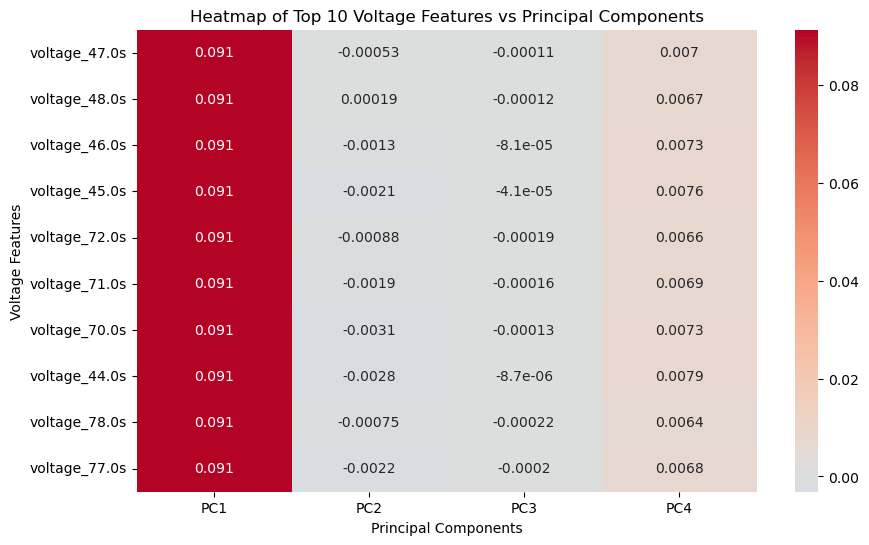

In [613]:
# Here, I wanted to visually compare how each top voltage feature contributes across multiple PCs at once, making it easy to see patterns of influence
# Heatmap
plt.figure(figsize=(10,6))
sns.heatmap(top_voltage_loadings_signed, annot=True, cmap="coolwarm", center=0)
plt.title("Heatmap of Top 10 Voltage Features vs Principal Components")
plt.xlabel("Principal Components")
plt.ylabel("Voltage Features")
plt.show()

#### Line plot-PC1 loadings of voltage features plotted over time

C:\Users\uhabiba\AppData\Local\Temp\1\ipykernel_41044\4223598718.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sorted_loadings = [pc1_voltage_loadings[i] for i in sorted_indices]


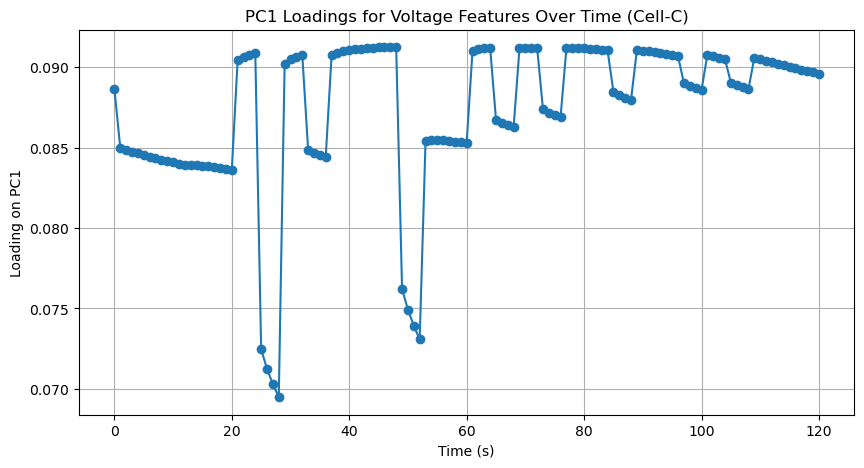

In [614]:
# Here, I wanted to visualize which time points in the voltage trace has most effect in shaping PC1
# It will show how strongly each voltage measurement contributes to PC1 across the pulse test

# Filtering voltage columns 
voltage_columns = [col for col in numeric_C.columns if col.startswith('voltage_')]

# Extracting PC1 loadings for voltage features
pc1_voltage_loadings = loadings.loc[voltage_columns, 'PC1']

# Extracting time from column names (like-'voltage_0.0s' → 0.0)
voltage_times = [float(col.split('_')[1].replace('s', '')) for col in voltage_columns]

# Sortting by time
sorted_indices = sorted(range(len(voltage_times)), key=lambda i: voltage_times[i])
sorted_times = [voltage_times[i] for i in sorted_indices]
sorted_loadings = [pc1_voltage_loadings[i] for i in sorted_indices]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(sorted_times, sorted_loadings, marker='o')
plt.title('PC1 Loadings for Voltage Features Over Time (Cell-C)')
plt.xlabel('Time (s)')
plt.ylabel('Loading on PC1')
plt.grid(True)
plt.show()


#### Line plot-PCA loadings of voltage and Current features over time for PC1–PC4

C:\Users\uhabiba\AppData\Local\Temp\1\ipykernel_41044\2359177209.py:23: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax2.plot(voltage_times, example_voltage_trace.values, 'k--', color='black')


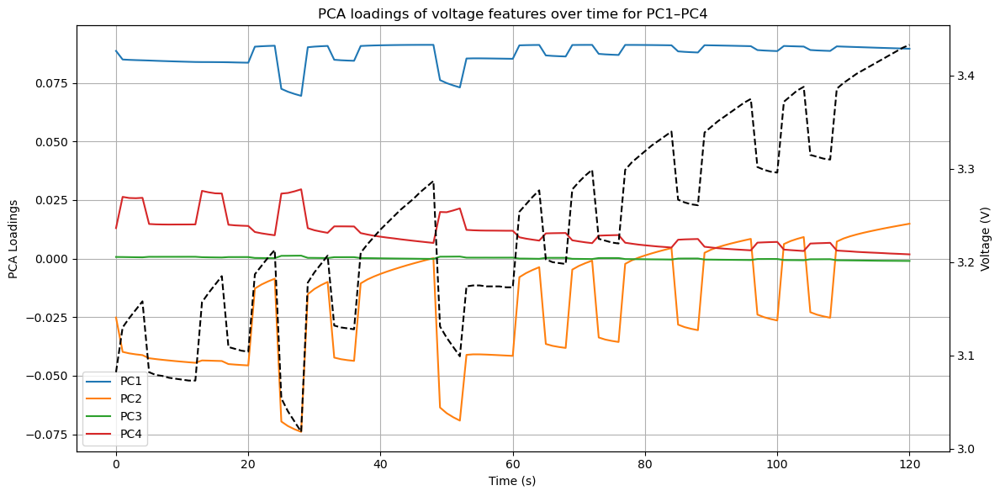

In [615]:
# Here, I wanted to visualize how different principal components are influenced by voltage features at specific times, and to compare this against 
# the actual voltage profile.

# Extracting and sortting voltage features and times
voltage_columns = sorted([c for c in numeric_C.columns if c.startswith('voltage_')], key=lambda x: float(x.split('_')[1].replace('s', '')))
voltage_times = [float(c.split('_')[1].replace('s', '')) for c in voltage_columns]

# PCA loadings for voltage features 
pc_voltage_loadings = (loadings.loc[voltage_columns, ['PC1', 'PC2', 'PC3', 'PC4']].assign(time=voltage_times))
example_voltage_trace = numeric_C.loc[numeric_C.index[0], voltage_columns] 

# Plot 
fig, ax1 = plt.subplots(figsize=(12, 6))

# PCA loadings
pc_voltage_loadings.plot(x='time', ax=ax1)
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('PCA Loadings')
ax1.grid(True)

# Voltage trace on secondary axis
ax2 = ax1.twinx()
ax2.plot(voltage_times, example_voltage_trace.values, 'k--', color='black')
ax2.set_ylabel('Voltage (V)', color='black')
ax2.tick_params(axis='y', labelcolor='black')

plt.title('PCA loadings of voltage features over time for PC1–PC4')
plt.tight_layout()
plt.show()


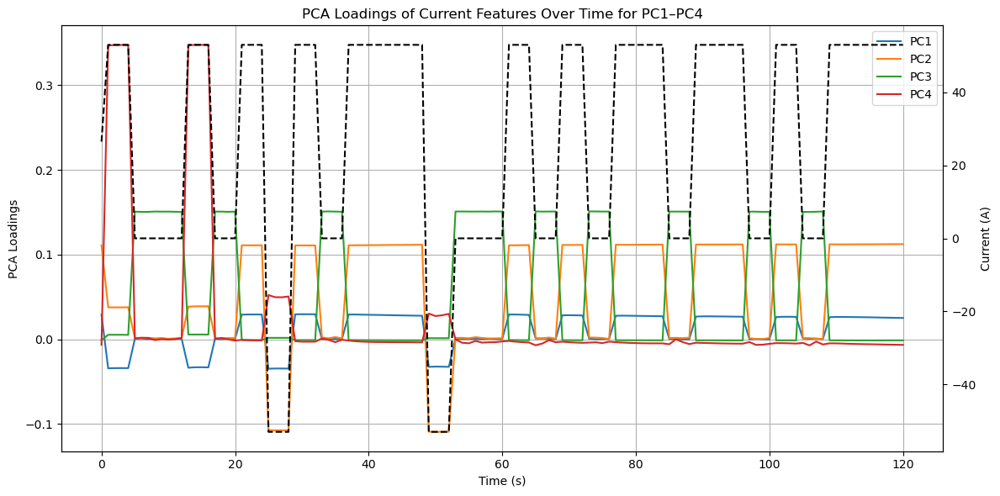

In [616]:
# Extract and sort current features and times
current_columns = sorted(
    [c for c in numeric_C.columns if c.startswith('current_')],
    key=lambda x: float(x.split('_')[1].replace('s', ''))
)
current_times = [float(c.split('_')[1].replace('s', '')) for c in current_columns]

# PCA loadings for current features
pc_current_loadings = loadings.loc[current_columns, ['PC1', 'PC2', 'PC3', 'PC4']].copy()
pc_current_loadings['time'] = current_times

# Example current trace (first row)
example_current_trace = numeric_C.loc[numeric_C.index[0], current_columns]

# Plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot PCA loadings
pc_current_loadings.plot(x='time', ax=ax1)
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('PCA Loadings')
ax1.grid(True)

# Plot current trace on secondary y-axis
ax2 = ax1.twinx()
ax2.plot(current_times, example_current_trace.values, linestyle='--', color='black')
ax2.set_ylabel('Current (A)', color='black')
ax2.tick_params(axis='y', labelcolor='black')

plt.title('PCA Loadings of Current Features Over Time for PC1–PC4')
plt.tight_layout()
plt.show()


#### Line plot - Absolute PCA loadings of voltage and Current features over time

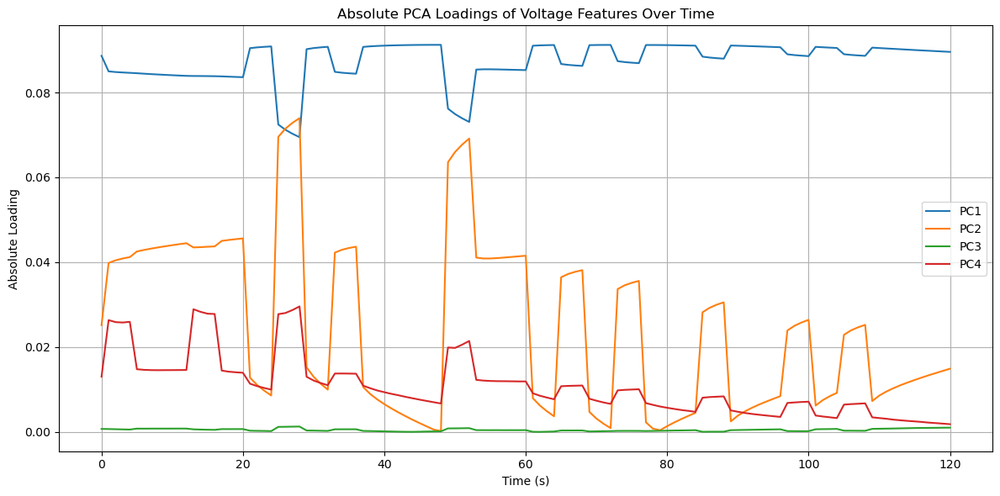

In [617]:
# Here, I wanted to focus on the magnitude of contribution rather than the direction like positive or negative
# so, these absolute loadings over time will show  which time intervals in the voltage are most strongly associated with each principal component

plt.figure(figsize=(12, 6))

for pc in ['PC1', 'PC2', 'PC3', 'PC4']:
    plt.plot(pc_voltage_loadings['time'], pc_voltage_loadings[pc].abs(), label=pc)

plt.title('Absolute PCA Loadings of Voltage Features Over Time')
plt.xlabel('Time (s)')
plt.ylabel('Absolute Loading')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


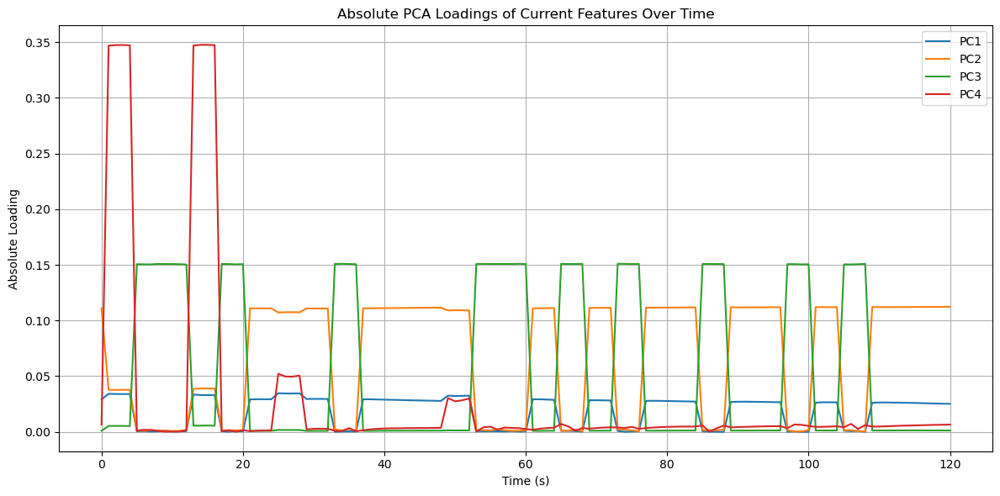

In [618]:
plt.figure(figsize=(12, 6))

for pc in ['PC1', 'PC2', 'PC3', 'PC4']:
    plt.plot(pc_current_loadings['time'], pc_current_loadings[pc].abs(), label=pc)

plt.title('Absolute PCA Loadings of Current Features Over Time')
plt.xlabel('Time (s)')
plt.ylabel('Absolute Loading')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Top 10 features contributing to PC2, PC3, and PC4

In [619]:
#Here, in thsi step I tried to identify the top 10 features that contribute most to PC2, PC3, and PC4, complementing the earlier analysis of PC1.
# Since, the top 10 features contributing PC1 (around 0.091) has very little contribution to PC2, PC3, and PC4 (almost close to zero).

# Use the original column names from numeric_C
loadings = pd.DataFrame(pca.components_.T, index=numeric_C.columns,columns=[f'PC{i+1}' for i in range(pca.n_components_)])

# Get top 10 features for each PC (excluding PC1)
top_features_pc2 = loadings['PC2'].abs().sort_values(ascending=False).head(10)
top_features_pc3 = loadings['PC3'].abs().sort_values(ascending=False).head(10)
top_features_pc4 = loadings['PC4'].abs().sort_values(ascending=False).head(10)

# Display them
print("Top 10 features contributing to PC2:")
print(top_features_pc2)

print("\nTop 10 features contributing to PC3:")
print(top_features_pc3)

print("\nTop 10 features contributing to PC4:")
print(top_features_pc4)

Top 10 features contributing to PC2:
current_120.0s    0.112331
current_119.0s    0.112301
current_118.0s    0.112271
current_117.0s    0.112236
current_116.0s    0.112190
current_115.0s    0.112140
current_109.0s    0.112131
current_114.0s    0.112110
current_113.0s    0.112084
current_101.0s    0.112077
Name: PC2, dtype: float64

Top 10 features contributing to PC3:
current_73.0s     0.150957
current_59.0s     0.150937
current_65.0s     0.150932
current_34.0s     0.150916
current_74.0s     0.150910
current_68.0s     0.150902
current_108.0s    0.150897
current_54.0s     0.150878
current_76.0s     0.150836
current_57.0s     0.150827
Name: PC3, dtype: float64

Top 10 features contributing to PC4:
current_15.0s    0.347555
current_14.0s    0.347526
current_3.0s     0.347428
current_2.0s     0.347347
current_16.0s    0.347286
current_4.0s     0.347132
current_13.0s    0.346994
current_1.0s     0.346821
current_25.0s    0.052192
current_28.0s    0.050574
Name: PC4, dtype: float64


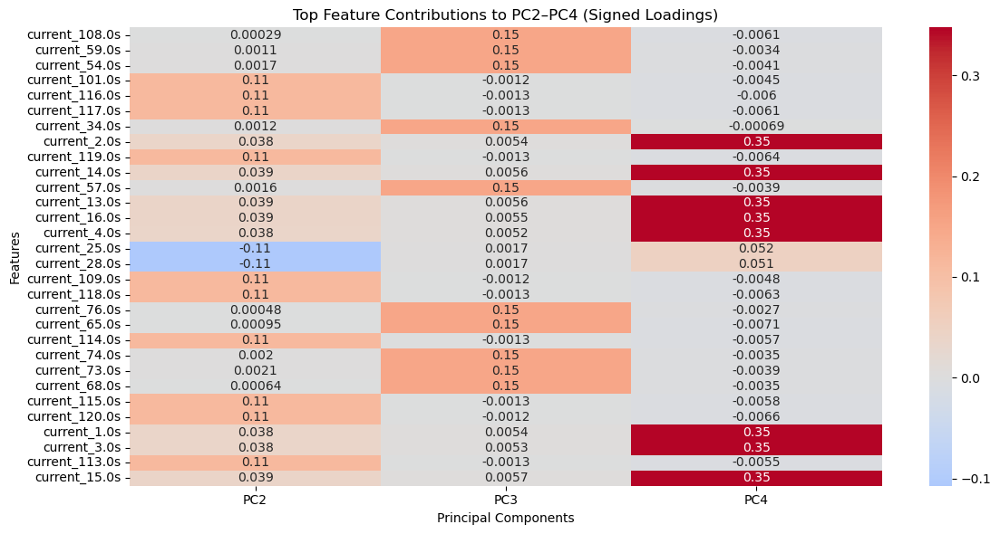

In [620]:

# Getting top 10 features for PC2-PC4
top_features_pc2 = loadings['PC2'].abs().sort_values(ascending=False).head(10).index
top_features_pc3 = loadings['PC3'].abs().sort_values(ascending=False).head(10).index
top_features_pc4 = loadings['PC4'].abs().sort_values(ascending=False).head(10).index

# 
top_features_combined = list(set(top_features_pc2) | set(top_features_pc3) | set(top_features_pc4))
combined_loadings = loadings.loc[top_features_combined, ['PC2', 'PC3', 'PC4']]

# Heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(combined_loadings, annot=True, cmap='coolwarm', center=0)
plt.title("Top Feature Contributions to PC2–PC4 (Signed Loadings)")
plt.xlabel("Principal Components")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

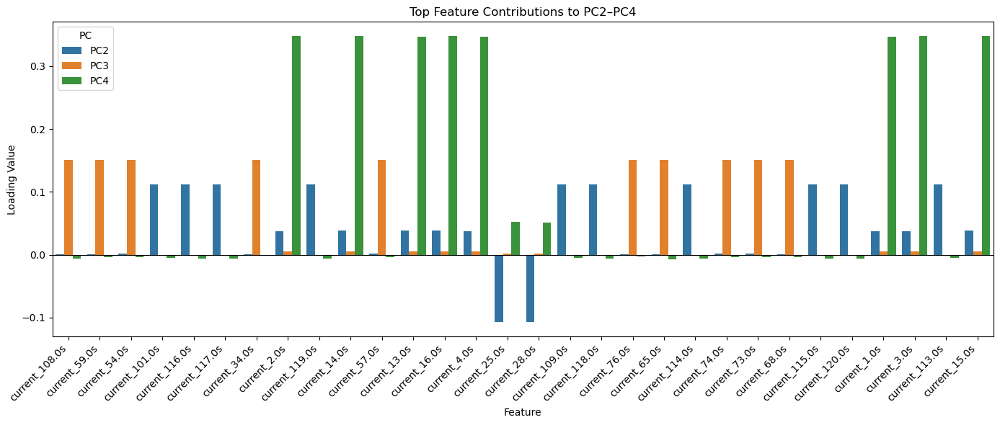

In [621]:
melted = combined_loadings.reset_index().melt(id_vars='index', var_name='PC', value_name='Loading')
melted.rename(columns={'index': 'Feature'}, inplace=True)

plt.figure(figsize=(14, 6))
sns.barplot(data=melted, x='Feature', y='Loading', hue='PC')
plt.title("Top Feature Contributions to PC2–PC4")
plt.ylabel("Loading Value")
plt.xticks(rotation=45, ha='right')
plt.axhline(0, color='black', linewidth=0.8)
plt.tight_layout()
plt.show()

### Top Contributing Features to Principal Components (PC1–PC4)

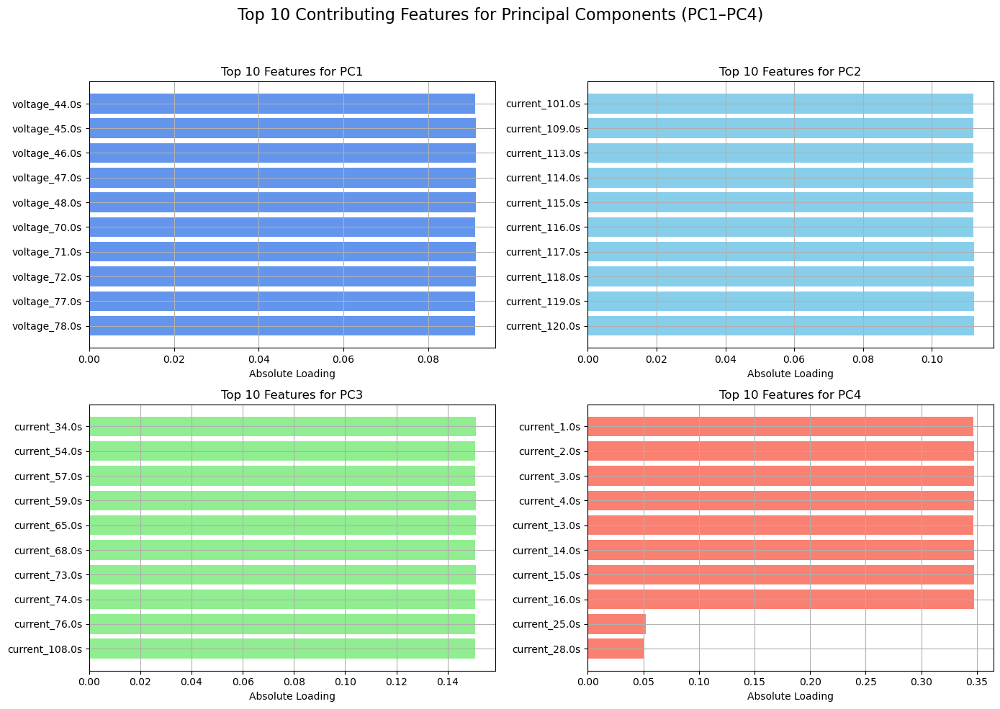

In [622]:
# Defining a function to extract time from feature names
def extract_time(feature_name):
    try:
        return float(feature_name.split('_')[1].replace('s', ''))
    except:
        return float('inf')  # Push non-time features (like soc, temperature) to the end

# Getting top 10 features for each PC
top_features_pc1 = loadings['PC1'].abs().sort_values(ascending=False).head(10)
top_features_pc1 = top_features_pc1.loc[sorted(top_features_pc1.index, key=extract_time)]

top_features_pc2 = loadings['PC2'].abs().sort_values(ascending=False).head(10)
top_features_pc2 = top_features_pc2.loc[sorted(top_features_pc2.index, key=extract_time)]

top_features_pc3 = loadings['PC3'].abs().sort_values(ascending=False).head(10)
top_features_pc3 = top_features_pc3.loc[sorted(top_features_pc3.index, key=extract_time)]

top_features_pc4 = loadings['PC4'].abs().sort_values(ascending=False).head(10)
top_features_pc4 = top_features_pc4.loc[sorted(top_features_pc4.index, key=extract_time)]

# Setting up 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# PC1
axes[0].barh(top_features_pc1.index[::-1], top_features_pc1.values[::-1], color='cornflowerblue')
axes[0].set_title('Top 10 Features for PC1')
axes[0].set_xlabel('Absolute Loading')
axes[0].grid(True)

# PC2
axes[1].barh(top_features_pc2.index[::-1], top_features_pc2.values[::-1], color='skyblue')
axes[1].set_title('Top 10 Features for PC2')
axes[1].set_xlabel('Absolute Loading')
axes[1].grid(True)

# PC3
axes[2].barh(top_features_pc3.index[::-1], top_features_pc3.values[::-1], color='lightgreen')
axes[2].set_title('Top 10 Features for PC3')
axes[2].set_xlabel('Absolute Loading')
axes[2].grid(True)

# PC4
axes[3].barh(top_features_pc4.index[::-1], top_features_pc4.values[::-1], color='salmon')
axes[3].set_title('Top 10 Features for PC4')
axes[3].set_xlabel('Absolute Loading')
axes[3].grid(True)

# Adding a common title
plt.suptitle('Top 10 Contributing Features for Principal Components (PC1–PC4)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



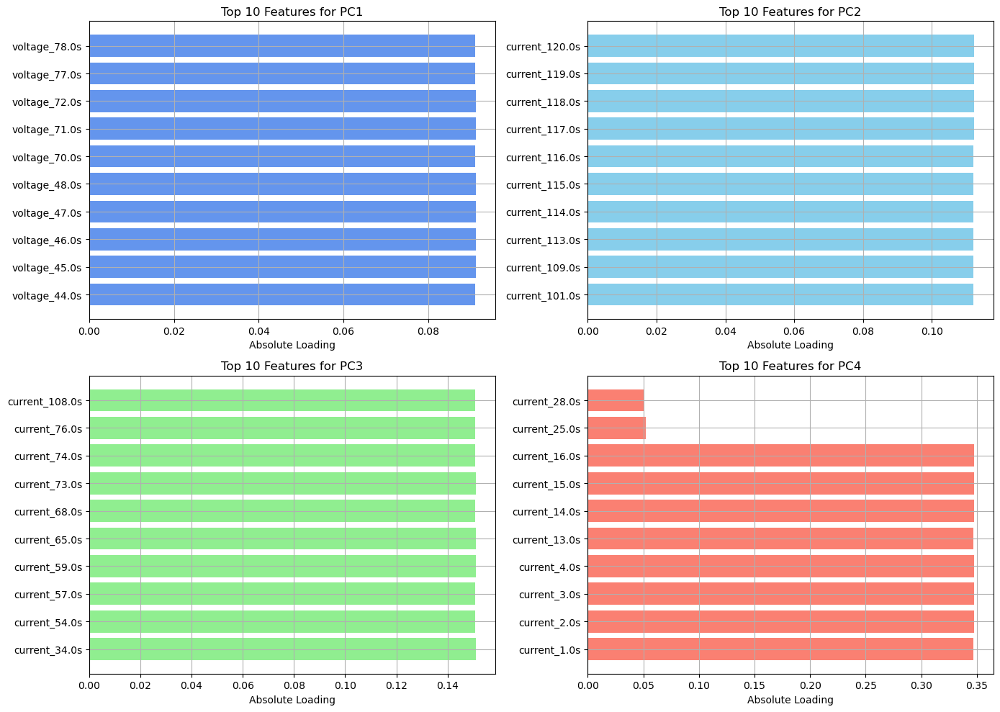

In [623]:
# Defining a function to extract time from feature names
def extract_time(feature_name):
    try:
        return float(feature_name.split('_')[1].replace('s', ''))
    except:
        return float('inf')  # Push non-time features to the end

# Getting top 10 features for each PC
top_features_pc1 = loadings['PC1'].abs().sort_values(ascending=False).head(10)
top_features_pc1 = top_features_pc1.loc[sorted(top_features_pc1.index, key=extract_time)]

top_features_pc2 = loadings['PC2'].abs().sort_values(ascending=False).head(10)
top_features_pc2 = top_features_pc2.loc[sorted(top_features_pc2.index, key=extract_time)]

top_features_pc3 = loadings['PC3'].abs().sort_values(ascending=False).head(10)
top_features_pc3 = top_features_pc3.loc[sorted(top_features_pc3.index, key=extract_time)]

top_features_pc4 = loadings['PC4'].abs().sort_values(ascending=False).head(10)
top_features_pc4 = top_features_pc4.loc[sorted(top_features_pc4.index, key=extract_time)]

# Setting up 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# PC1
axes[0].barh(top_features_pc1.index, top_features_pc1.values, color='cornflowerblue')
axes[0].set_title('Top 10 Features for PC1')
axes[0].set_xlabel('Absolute Loading')
axes[0].grid(True)

# PC2
axes[1].barh(top_features_pc2.index, top_features_pc2.values, color='skyblue')
axes[1].set_title('Top 10 Features for PC2')
axes[1].set_xlabel('Absolute Loading')
axes[1].grid(True)

# PC3
axes[2].barh(top_features_pc3.index, top_features_pc3.values, color='lightgreen')
axes[2].set_title('Top 10 Features for PC3')
axes[2].set_xlabel('Absolute Loading')
axes[2].grid(True)

# PC4
axes[3].barh(top_features_pc4.index, top_features_pc4.values, color='salmon')
axes[3].set_title('Top 10 Features for PC4')
axes[3].set_xlabel('Absolute Loading')
axes[3].grid(True)

plt.tight_layout()

C:\Users\uhabiba\AppData\Local\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


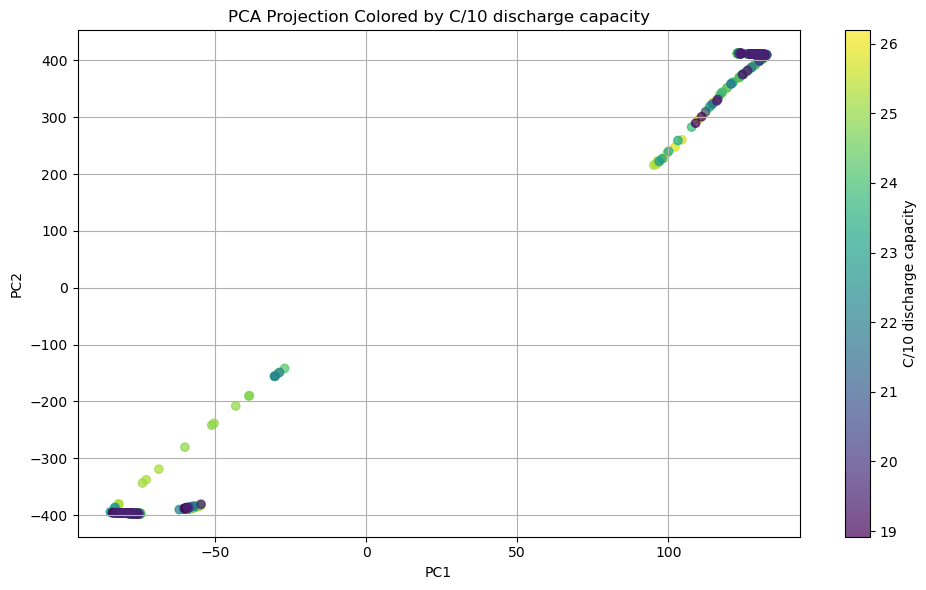

In [624]:

# Transformming the data using PCA
pca_scores = pca.transform(numeric_C)

# Choosing a target variable to color by
target_variable = 'C/10 discharge capacity'
target_values = new_data_C[target_variable]

# Normalizing target values for color mapping
norm = plt.Normalize(target_values.min(), target_values.max())
cmap = cm.viridis

# Plotting PC1 vs PC2
plt.figure(figsize=(10, 6))
scatter = plt.scatter(pca_scores[:, 0], pca_scores[:, 1], c=target_values, cmap=cmap, norm=norm, alpha=0.7)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'PCA Projection Colored by {target_variable}')
cbar = plt.colorbar(scatter)
cbar.set_label(target_variable)
plt.grid(True)
plt.tight_layout()
plt.show()


##### PC1 vs targeted variable

C:\Users\uhabiba\AppData\Local\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


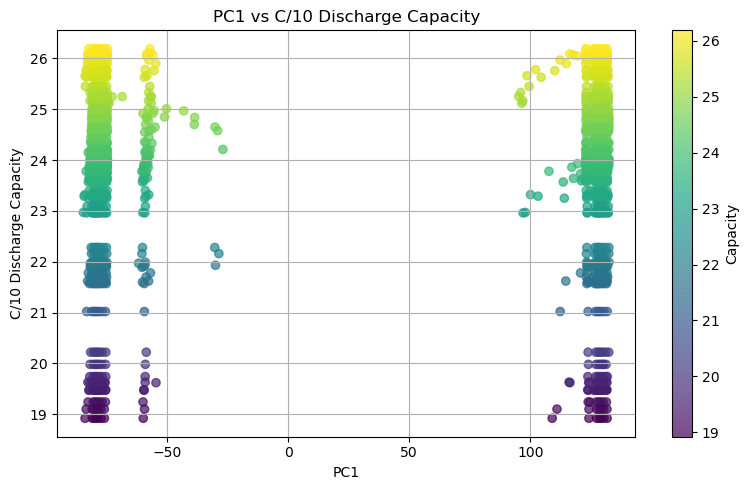

Correlation between PC1 and C/10 capacity: 0.003


In [625]:
# Getting PC1 values
pc1_values = pca.transform(numeric_C)[:, 0]

# Choosing a target variable
target = new_data_C['C/10 discharge capacity']

# Plotting PC1 vs target variable
plt.figure(figsize=(8, 5))
scatter = plt.scatter(pc1_values, target, c=target, cmap='viridis', alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('C/10 Discharge Capacity')
plt.title('PC1 vs C/10 Discharge Capacity')
plt.colorbar(scatter, label='Capacity')
plt.grid(True)
plt.tight_layout()
plt.show()

# Calculating correlation
correlation = np.corrcoef(pc1_values, target)[0, 1]
print(f"Correlation between PC1 and C/10 capacity: {correlation:.3f}")


C:\Users\uhabiba\AppData\Local\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


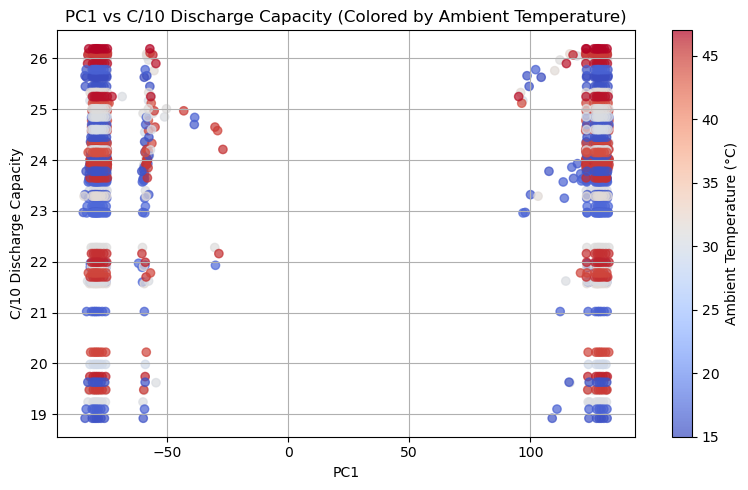

Correlation between PC1 and C/10 capacity: 0.003


In [626]:
# Getting PC1 values
pc1_values = pca.transform(numeric_C)[:, 0]

# Choosing a target variable
target = new_data_C['C/10 discharge capacity']

# Ambient temperature for coloring
temperature = new_data_C['temperature_ambient']

# Plotting PC1 vs target variable, colored by ambient temperature
plt.figure(figsize=(8, 5))
scatter = plt.scatter(pc1_values, target, c=temperature, cmap='coolwarm', alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('C/10 Discharge Capacity')
plt.title('PC1 vs C/10 Discharge Capacity (Colored by Ambient Temperature)')
cbar = plt.colorbar(scatter)
cbar.set_label('Ambient Temperature (°C)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Calculating correlation
correlation = np.corrcoef(pc1_values, target)[0, 1]
print(f"Correlation between PC1 and C/10 capacity: {correlation:.3f}")


#### Plots PC1 vs each target, colored by ambient temperature

C:\Users\uhabiba\AppData\Local\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


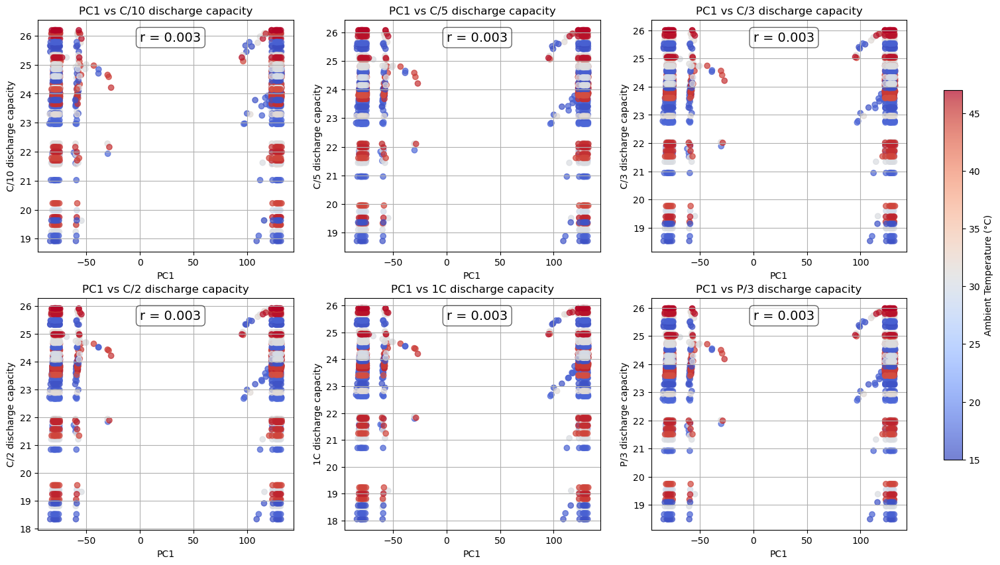

In [627]:
# Getting PC1 values
pc1_values = pca.transform(numeric_C)[:, 0]

# Ambient temperature for coloring
temperature = new_data_C['temperature_ambient']

# Listting the targeted variables
target_vars = [
    'C/10 discharge capacity',
    'C/5 discharge capacity',
    'C/3 discharge capacity',
    'C/2 discharge capacity',
    '1C discharge capacity',
    'P/3 discharge capacity']

# Creating subplots: 2 rows x 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

# Plotting each target variable
for i, target_name in enumerate(target_vars):
    ax = axes[i]
    target = new_data_C[target_name]
    
    # Scatter plot
    scatter = ax.scatter(pc1_values, target, c=temperature, cmap='coolwarm', alpha=0.7)
    
    # Calculating correlation
    correlation = np.corrcoef(pc1_values, target)[0, 1]
    
    # Addding correlation text to the plot
    ax.text(0.4, 0.95, f'r = {correlation:.3f}', transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=dict(boxstyle='round', 
                                                                                                                         facecolor='white', alpha=0.6))
    
    # Labels and title
    ax.set_title(f'PC1 vs {target_name}')
    ax.set_xlabel('PC1')
    ax.set_ylabel(target_name)
    ax.grid(True)

# Addding a single colorbar for all plots
cbar = fig.colorbar(scatter, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label('Ambient Temperature (°C)')

#plt.tight_layout()
plt.show()


#### Plots PC2 vs each target, colored by ambient temperature

C:\Users\uhabiba\AppData\Local\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


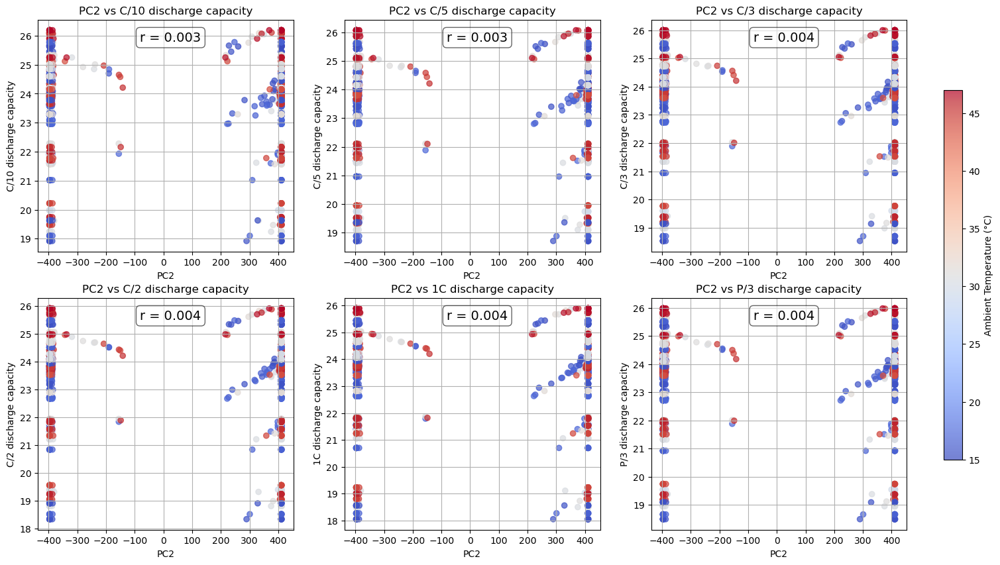

In [628]:
# Getting PC2 values
pc2_values = pca.transform(numeric_C)[:, 1]

# Creating subplots: 2 rows x 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

# Plotting each target variable
for i, target_name in enumerate(target_vars):
    ax = axes[i]
    target = new_data_C[target_name]
    
    # Scatter plot
    scatter = ax.scatter(pc2_values, target, c=temperature, cmap='coolwarm', alpha=0.7)
    
    # Calculating correlation
    correlation = np.corrcoef(pc2_values, target)[0, 1]
    
    # Adding correlation text
    ax.text(0.4, 0.95, f'r = {correlation:.3f}', transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=dict(boxstyle='round', 
                                                                                                                         facecolor='white', alpha=0.6))
    
    ax.set_title(f'PC2 vs {target_name}')
    ax.set_xlabel('PC2')
    ax.set_ylabel(target_name)
    ax.grid(True)

# Adding a single colorbar
cbar = fig.colorbar(scatter, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label('Ambient Temperature (°C)')

#plt.tight_layout()
plt.show()


#### Plots PC3 vs each target, colored by ambient temperature

C:\Users\uhabiba\AppData\Local\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


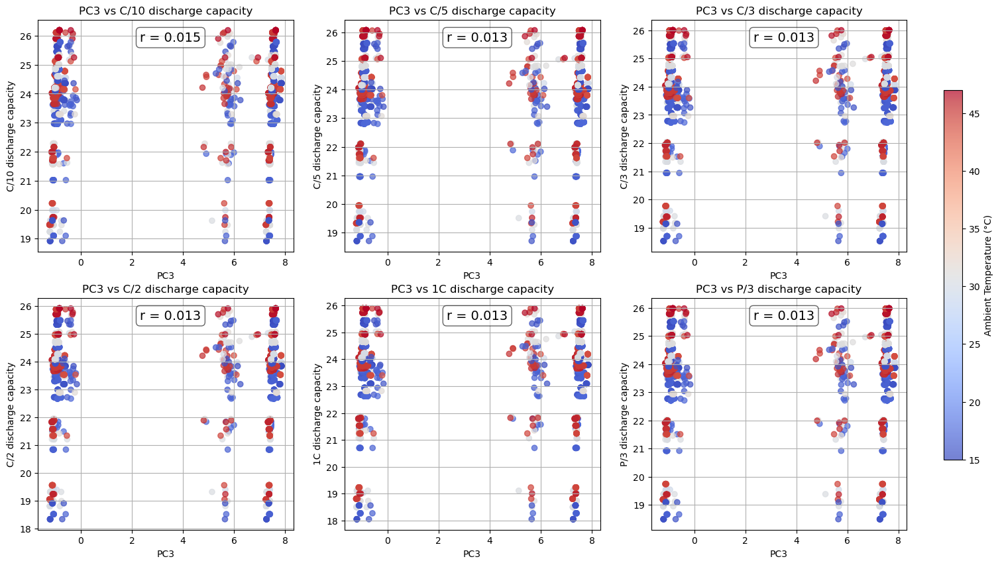

In [629]:
# Getting PC3 values
pc3_values = pca.transform(numeric_C)[:, 2]

# Creating subplots: 2 rows x 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

# Plotting each target variable
for i, target_name in enumerate(target_vars):
    ax = axes[i]
    target = new_data_C[target_name]
    
    # Scatter plot
    scatter = ax.scatter(pc3_values, target, c=temperature, cmap='coolwarm', alpha=0.7)
    
    # Calculating correlation
    correlation = np.corrcoef(pc3_values, target)[0, 1]
    
    # Adding correlation text
    ax.text(0.4, 0.95, f'r = {correlation:.3f}', transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=dict(boxstyle='round', 
                                                                                                                         facecolor='white', alpha=0.6))
    
    ax.set_title(f'PC3 vs {target_name}')
    ax.set_xlabel('PC3')
    ax.set_ylabel(target_name)
    ax.grid(True)

# Adding a single colorbar
cbar = fig.colorbar(scatter, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label('Ambient Temperature (°C)')

#plt.tight_layout()
plt.show()


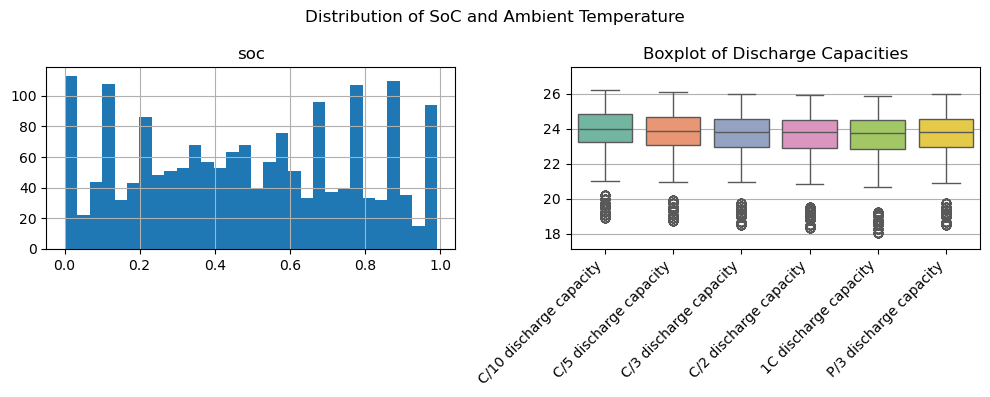

In [630]:

# Histogram
numeric_C[['soc', 'temperature_ambient']].hist(bins=30, figsize=(10, 4))
plt.suptitle("Distribution of SoC and Ambient Temperature")

# Boxplot for target variables
# target_cols = ['C/10 discharge capacity', 'C/5 discharge capacity', 'C/3 discharge capacity',
#                'C/2 discharge capacity', '1C discharge capacity', 'P/3 discharge capacity']
# sns.boxplot(data=numeric_C[target_cols])
# plt.xticks(rotation=45)
# plt.title("Boxplot of Discharge Capacities")


target_cols = ['C/10 discharge capacity', 'C/5 discharge capacity', 'C/3 discharge capacity',
               'C/2 discharge capacity', '1C discharge capacity', 'P/3 discharge capacity']

sns.boxplot(data=numeric_C[target_cols], palette='Set2')
plt.xticks(rotation=45, ha='right')
plt.title("Boxplot of Discharge Capacities")

# Setting y-axis limits to reduce empty space
plt.ylim(numeric_C[target_cols].min().min() * 0.95, numeric_C[target_cols].max().max() * 1.05)

plt.tight_layout()
plt.show()


Text(0, 0.5, 'Variance Ratio')

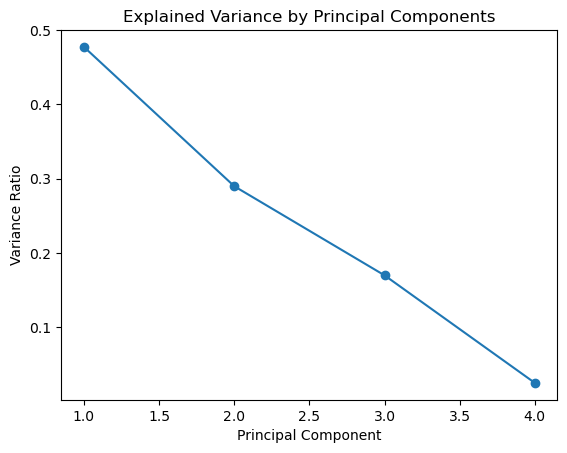

In [631]:
# Scree plot
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, marker='o')
plt.title('Explained Variance by Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Variance Ratio')


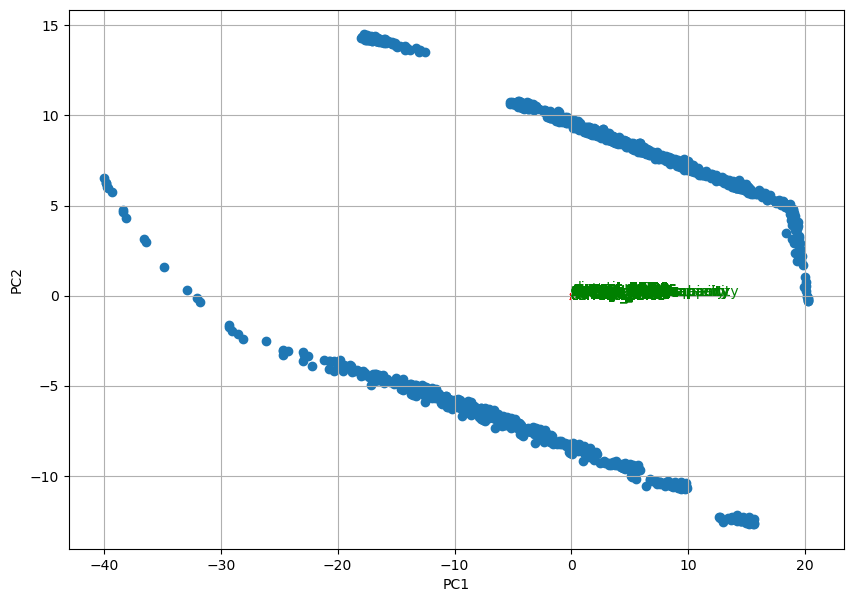

In [632]:

# Biplot
def biplot(score, coeff, labels=None):
    xs = score[:,0]
    ys = score[:,1]
    plt.figure(figsize=(10, 7))
    plt.scatter(xs, ys)
    for i in range(coeff.shape[0]):
        plt.arrow(0, 0, coeff[i,0]*2, coeff[i,1]*2, color='r', alpha=0.5)
        if labels is None:
            plt.text(coeff[i,0]*2.2, coeff[i,1]*2.2, "Var"+str(i+1), color='g')
        else:
            plt.text(coeff[i,0]*2.2, coeff[i,1]*2.2, labels[i], color='g')
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.grid()

biplot(X_pca, np.transpose(pca.components_), labels=numeric_C.columns)


### Predict discharge capacity values 

In [633]:
# Choosing a target variable
target = 'C/10 discharge capacity'
print(new_data_C[target].describe())


count    1764.000000
mean       23.700323
std         1.729965
min        18.920000
25%        23.250000
50%        23.970000
75%        24.840000
max        26.190000
Name: C/10 discharge capacity, dtype: float64


In [634]:
# Preparing the data
# Splitting the dataset into: Features (all columns except the target) and Target (the discharge capacity predicting)

X = numeric_C.drop(columns=target_vars)  # drop all target columns
y = numeric_C[target]

# print(X)
# print (y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


#### PCA on training data 

In [635]:
# Standardizing features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fitting PCA to retain 95% of variance
pca = PCA(n_components=0.95)  
X_train_pca = pca.fit_transform(X_train_scaled)

print("Number of components chosen:", pca.n_components_)
print("Explained variance ratio:", pca.explained_variance_ratio_)

# Transforming test data using the same PCA
X_test_pca = pca.transform(X_test_scaled)


Number of components chosen: 3
Explained variance ratio: [0.49059424 0.29523839 0.17402261]


I did PCA to the standardized training data for Cell Type C for a effective modeling while preserving most of the data's structure. Three principal components were selected, capturing a total of 96.0% of the variance in the original feature space. The first component alone explained 49.1%, second component 29.5% and third component 17.4% . 

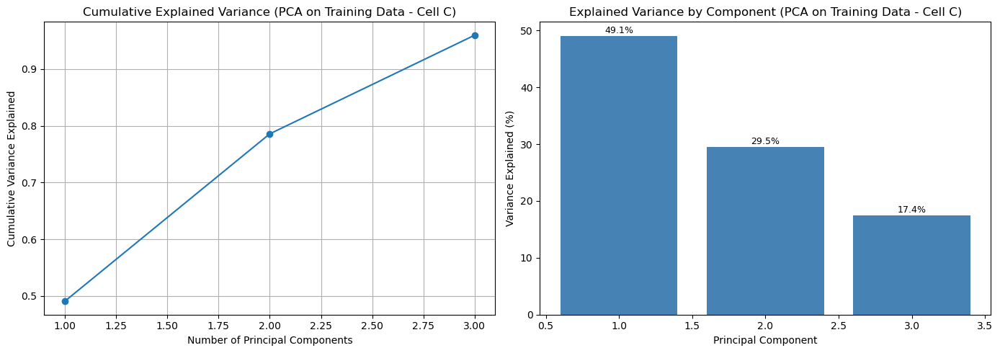

In [636]:

# Geting explained variance ratios from PCA fitted on training data
explained_var = pca.explained_variance_ratio_

# Creating subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Cumulative explained variance (line plot)
axes[0].plot(range(1, len(explained_var) + 1), np.cumsum(explained_var), marker='o', linestyle='-')
axes[0].set_title('Cumulative Explained Variance (PCA on Training Data - Cell C)')
axes[0].set_xlabel('Number of Principal Components')
axes[0].set_ylabel('Cumulative Variance Explained')
axes[0].grid(True)

# Plot 2: Individual explained variance (bar plot)
axes[1].bar(range(1, len(explained_var) + 1), explained_var * 100, color='steelblue')
axes[1].set_title('Explained Variance by Component (PCA on Training Data - Cell C)')
axes[1].set_xlabel('Principal Component')
axes[1].set_ylabel('Variance Explained (%)')

# Adding percentage labels on top of bars
for i, v in enumerate(explained_var * 100, start=1): axes[1].text(i, v + 0.5, f"{v:.1f}%", ha='center', fontsize=9)

plt.tight_layout()
plt.show()


#### linear regression model - PCA

i wanted to do a Linear Regression model using the PCA-transformed training data for Cell Type C to see how well the compressed representation of the data can predict the C/10 discharge capacity. The PCA reduced the original feature space to 3 principal components, capturing 96% of the variance. I plan to evaluate on the test set using RMSE and R² metrics. 

In [637]:

# Using PCA-transformed training and test data

# X_train_pca = pca.fit_transform(X_train_scaled)
# X_test_pca = pca.transform(X_test_scaled)

# Training Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train_pca, y_train)

# Making predictions on test data
y_pred_lr = lr_model.predict(X_test_pca)

# Evaluating the model
mse = mean_squared_error(y_test, y_pred_lr)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_lr)

print("Linear Regression using PCA components")
print("RMSE:", rmse)
print("R² Score:", r2)


Linear Regression using PCA components
RMSE: 1.769027028737806
R² Score: -0.006119059896771306


This Linear Regression model was trained using the PCA-transformed training data (3 components explaining 96% of the variance). However, the model performed poorly, with an RMSE of 1.77 and an R² score of -0.006. This indicates that the linear model was unable to capture the relationship between the compressed features and the C/10 discharge capacity. 

#### True vs Predicted Plots - Linear Regression Model(PCA) (Colored by Temperature & SOC)

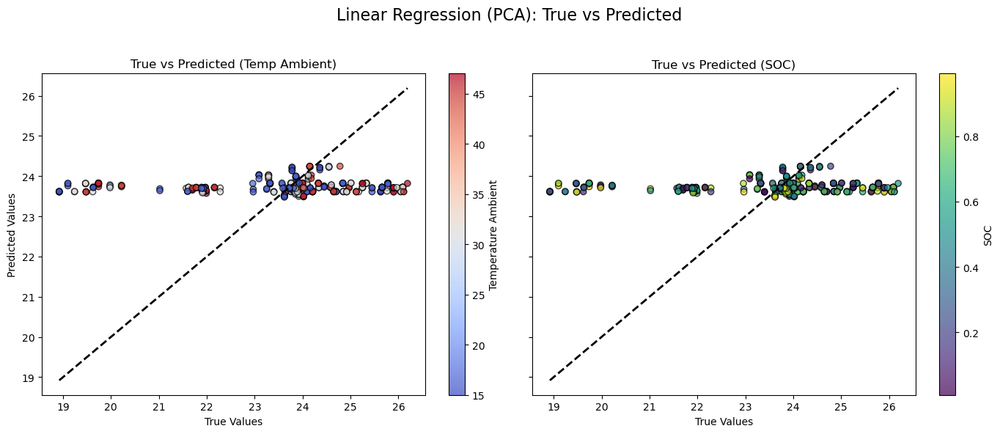

In [638]:
# Extracting coloring features
temperature = X_test['temperature_ambient']
soc = X_test['soc']

# Setting up side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Colored by temperature_ambient
sc1 = axes[0].scatter(y_test, y_pred_lr, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('True vs Predicted (Temp Ambient)')
axes[0].set_xlabel('True Values')
axes[0].set_ylabel('Predicted Values')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Colored by SOC
sc2 = axes[1].scatter(y_test, y_pred_lr, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1].set_title('True vs Predicted (SOC)')
axes[1].set_xlabel('True Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle('Linear Regression (PCA): True vs Predicted', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Residual Plots - Linear Regression Model (PCA) (Colored by Temperature & SOC)

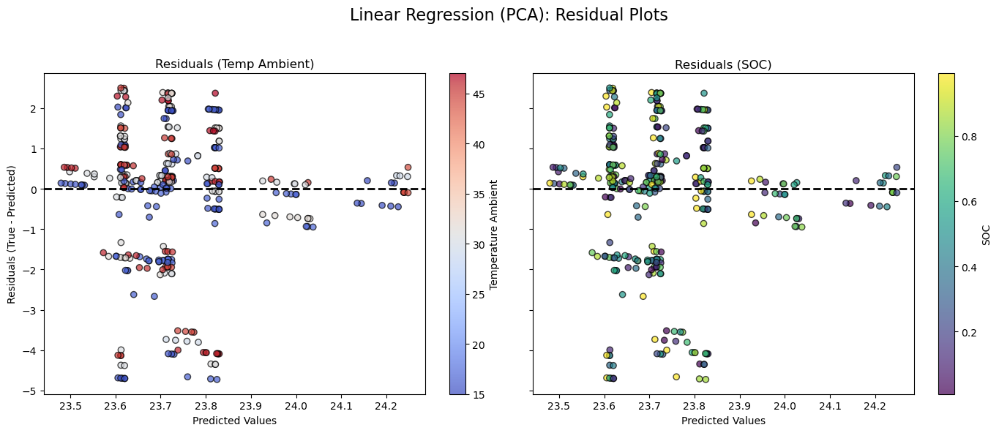

In [639]:
# Calculating residuals
residuals = y_test - y_pred_lr

# Setting up side-by-side residual plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Residuals colored by temperature_ambient
sc1 = axes[0].scatter(y_pred_lr, residuals, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].axhline(0, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Residuals (Temp Ambient)')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals (True - Predicted)')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Residuals colored by SOC
sc2 = axes[1].scatter(y_pred_lr, residuals, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].axhline(0, color='black', linestyle='--', linewidth=2)
axes[1].set_title('Residuals (SOC)')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle('Linear Regression (PCA): Residual Plots', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### linear regression model - all original features

In [640]:
# Train Linear Regression on all original features
lr_model_all = LinearRegression()
lr_model_all.fit(X_train, y_train)

# Predict on test set
y_pred_all = lr_model_all.predict(X_test)

# Evaluate
mse_all = mean_squared_error(y_test, y_pred_all)
rmse_all = np.sqrt(mse_all)
r2_all = r2_score(y_test, y_pred_all)

# Print results
print("Linear Regression using All Original Features")
print("RMSE:", rmse_all)
print("R² Score:", r2_all)


Linear Regression using All Original Features
RMSE: 5.1772488815457836
R² Score: -7.617445099848114


The PCA-based model performed significantly better than the model using all original features. The PCA-based model performed has RMSE of 1.77 and an R² score of -0.006 and the model using all original features has RMSE of 5.18 and an R² score of -7.617. The RMSE (Root Mean Squared Error) is much lower for the PCA model, so its predictions were closer to the actual values. The R² Score for the PCA model was close to 0, which is not great, but still much better than the negative R² from the all-feature model.

#### Random forest model using the  training data
since Linear Regression model failed i decided to do nonlinear model, Random forest model using the training data 

In [641]:
# Training using Random Forest  

rf_model= RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predicting on test set
y_pred_rf = rf_model.predict(X_test)

# Evaluating model
mse = mean_squared_error(y_test, y_pred_rf)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_rf)

print("Random Forest on Training data")
print("RMSE:", rmse)
print("R² Score:", r2)

Random Forest on Training data
RMSE: 1.067719987695579
R² Score: 0.6334821039150871


The Random Forest model has better result compare to the Linear Regression model.The Random Forest model performed has RMSE of 1.07 and an R² score of 0.633 and the PCA-based linear regression model performed has RMSE of 1.77 and an R² score of -0.006.

Random Forest model has lower RMSE (1.07) compare to 1.77, so its predictions were closer to the actual values. The R² value of 0.63 indicates that the Random Forest model explained 63% of the variance in the target variable, while the Linear Regression model explained alomost none since R² is colse to 0. Seems like the relationship between features and the target is non-linear

#### True vs Predicted Plots - Random Forest Model (Colored by Temperature & SOC)

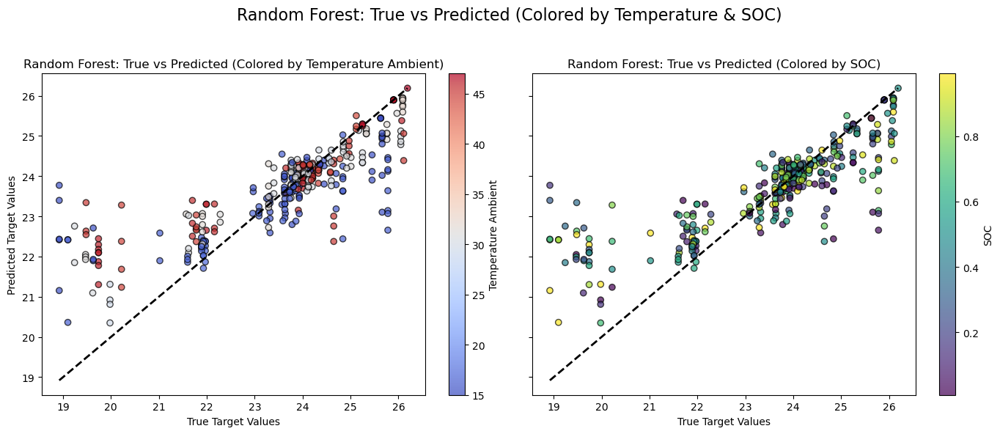

In [642]:
# Extracting features for coloring
temperature = X_test['temperature_ambient']
soc = X_test['soc']

# Setting up the figure
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Colored by temperature_ambient
sc1 = axes[0].scatter(y_test, y_pred_rf, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('Random Forest: True vs Predicted (Colored by Temperature Ambient)') 
axes[0].set_xlabel('True Target Values')
axes[0].set_ylabel('Predicted Target Values')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Colored by soc
sc2 = axes[1].scatter(y_test, y_pred_rf, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1].set_title('Random Forest: True vs Predicted (Colored by SOC)')
axes[1].set_xlabel('True Target Values')
axes[1].set_ylabel('') 
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')


plt.suptitle('Random Forest: True vs Predicted (Colored by Temperature & SOC)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Residual Plots - Random Forest Model (Colored by Temperature & SOC)

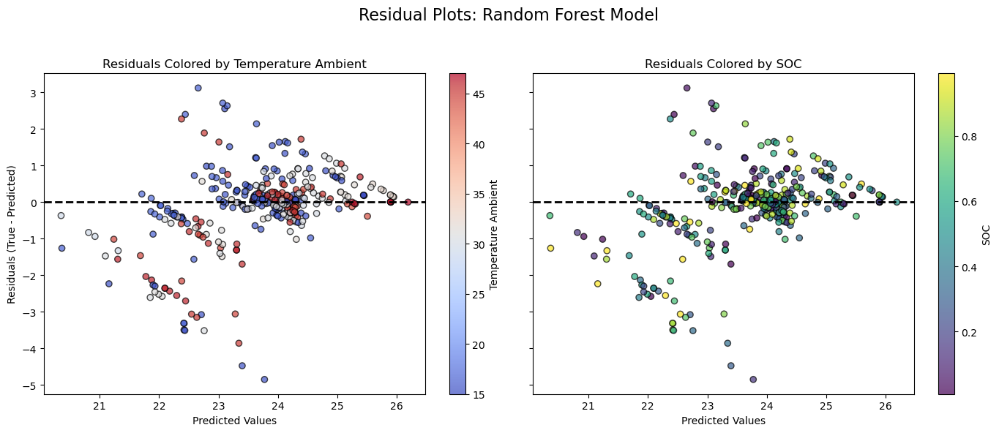

In [643]:

# Calculating residuals
residuals = y_test - y_pred_rf
temperature = X_test['temperature_ambient']
soc = X_test['soc']

# Setting up the figure
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Residuals colored by temperature_ambient
sc1 = axes[0].scatter(y_pred_rf, residuals, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].axhline(0, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Residuals Colored by Temperature Ambient')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals (True - Predicted)')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Residuals colored by SOC
sc2 = axes[1].scatter(y_pred_rf, residuals, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].axhline(0, color='black', linestyle='--', linewidth=2)
axes[1].set_title('Residuals Colored by SOC')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('') 
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

# Layout
plt.suptitle('Residual Plots: Random Forest Model', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### top 20 features

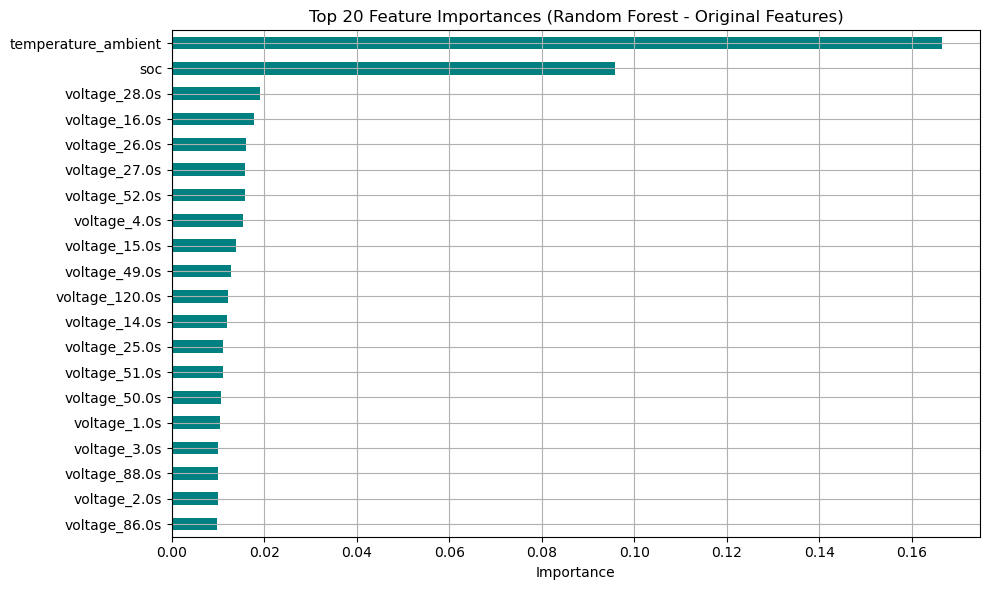

In [644]:

# Getting feature importances
importances = rf_model.feature_importances_
feature_names = X_train.columns  # Making sure this matches the original DataFrame
feat_imp = pd.Series(importances, index=feature_names).sort_values(ascending=False)

# Plot
plt.figure(figsize=(10, 6))
feat_imp.head(20).plot(kind='barh', color='teal')
plt.title('Top 20 Feature Importances (Random Forest - Original Features)')
plt.xlabel('Importance')
plt.gca().invert_yaxis()
plt.grid(True)
plt.tight_layout()
plt.show()



##### summary data for soc and temperature_ambient

In [645]:
summary_data = pd.concat([numeric_C[['soc', 'temperature_ambient']]], axis=1)
print(summary_data.describe())

               soc  temperature_ambient
count  1764.000000          1764.000000
mean      0.489315            29.982426
std       0.293624            11.733534
min       0.001119            15.000000
25%       0.230730            16.500000
50%       0.485214            30.500000
75%       0.744399            44.500000
max       0.991591            47.000000


#### Linear Regression (using only 'soc' and 'temperature_ambient') - top 2 features

In [646]:
# Selecting only the two most important features
selected_features = ['soc', 'temperature_ambient']
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Training Linear Regression model
lr_model_selected = LinearRegression()
lr_model_selected.fit(X_train_selected, y_train)

# Predicting on test set
y_pred_selected = lr_model_selected.predict(X_test_selected)

# Evaluating the model
mse_selected = mean_squared_error(y_test, y_pred_selected)
rmse_selected = np.sqrt(mse_selected)
r2_selected = r2_score(y_test, y_pred_selected)

# Printing results
print("Linear Regression using 'soc' and 'temperature_ambient'")
print("RMSE:", rmse_selected)
print("R² Score:", r2_selected)


Linear Regression using 'soc' and 'temperature_ambient'
RMSE: 1.7838149613393373
R² Score: -0.023010387883553474


#### True vs Predicted Plots - Linear Regression (soc & temp) (Colored by Temperature & SOC)

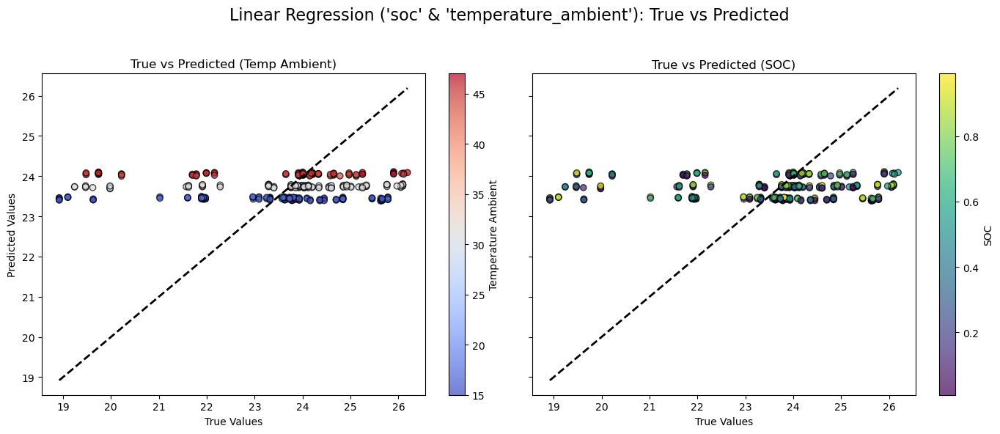

In [647]:
# Extracting features for coloring
temperature = X_test['temperature_ambient']
soc = X_test['soc']

# Setting up side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Colored by temperature_ambient
sc1 = axes[0].scatter(y_test, y_pred_selected, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('True vs Predicted (Temp Ambient)')
axes[0].set_xlabel('True Values')
axes[0].set_ylabel('Predicted Values')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Colored by SOC
sc2 = axes[1].scatter(y_test, y_pred_selected, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1].set_title('True vs Predicted (SOC)')
axes[1].set_xlabel('True Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("Linear Regression ('soc' & 'temperature_ambient'): True vs Predicted", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Residual Plots - Linear Regression (soc & temp) (Colored by Temperature & SOC)

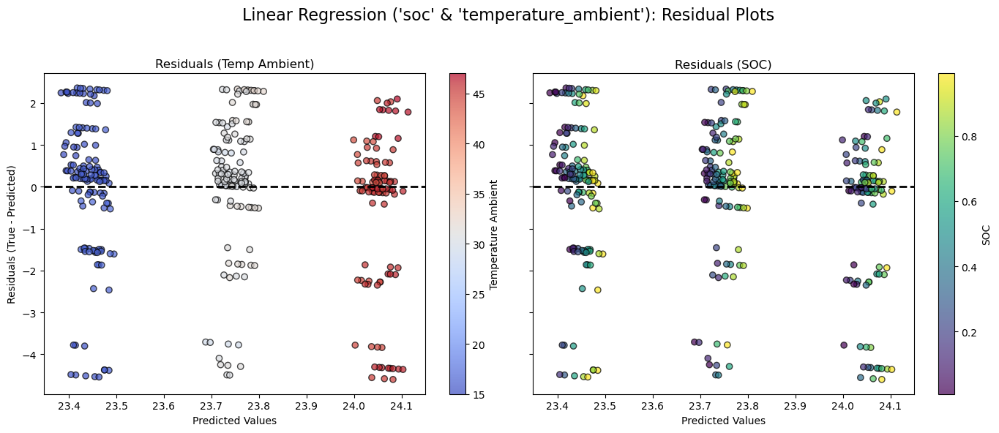

In [648]:
# Calculating residuals
residuals = y_test - y_pred_selected

# Setting up side-by-side residual plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Residuals colored by temperature_ambient
sc1 = axes[0].scatter(y_pred_selected, residuals, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].axhline(0, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Residuals (Temp Ambient)')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals (True - Predicted)')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Residuals colored by SOC
sc2 = axes[1].scatter(y_pred_selected, residuals, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].axhline(0, color='black', linestyle='--', linewidth=2)
axes[1].set_title('Residuals (SOC)')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("Linear Regression ('soc' & 'temperature_ambient'): Residual Plots", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Random Forest (using only 'soc' and 'temperature_ambient') - top 2 features

In [649]:
# Selecting only top 2 features
selected_features = ['soc', 'temperature_ambient']
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Training Random Forest
rf_model_selected = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_selected.fit(X_train_selected, y_train)

# Predicting and evaluating
y_pred_rf_selected = rf_model_selected.predict(X_test_selected)
mse_rf_selected = mean_squared_error(y_test, y_pred_rf_selected)
rmse_rf_selected = np.sqrt(mse_rf_selected)
r2_rf_selected = r2_score(y_test, y_pred_rf_selected)

print("Random Forest using 'soc' and 'temperature_ambient'")
print("RMSE:", rmse_rf_selected)
print("R² Score:", r2_rf_selected)


Random Forest using 'soc' and 'temperature_ambient'
RMSE: 1.7677057184456626
R² Score: -0.004616653234105428


####  True vs Predicted Plots -  Random Forest (soc & temp) (Colored by Temperature & SOC)

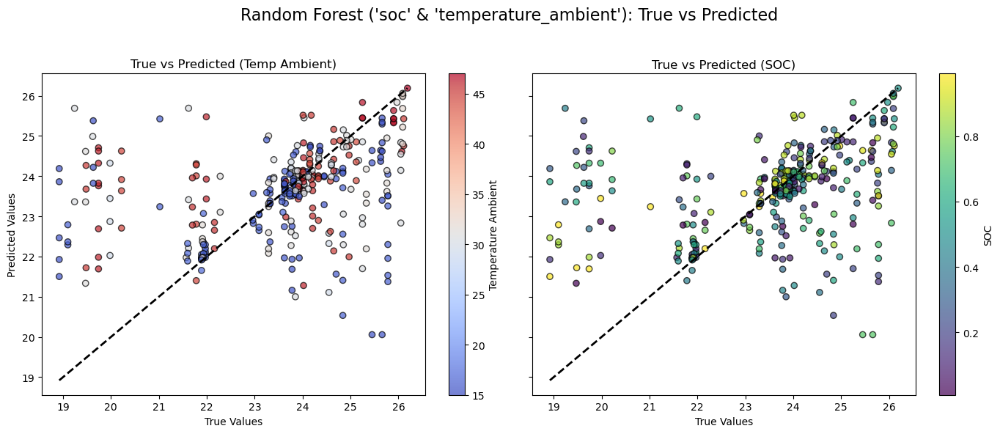

In [650]:
# Extracting features for coloring
temperature = X_test['temperature_ambient']
soc = X_test['soc']

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Colored by temperature_ambient
sc1 = axes[0].scatter(y_test, y_pred_rf_selected, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('True vs Predicted (Temp Ambient)')
axes[0].set_xlabel('True Values')
axes[0].set_ylabel('Predicted Values')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Colored by SOC
sc2 = axes[1].scatter(y_test, y_pred_rf_selected, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1].set_title('True vs Predicted (SOC)')
axes[1].set_xlabel('True Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("Random Forest ('soc' & 'temperature_ambient'): True vs Predicted", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Residual Plots - Random Forest (soc & temp) (Colored by Temperature & SOC)

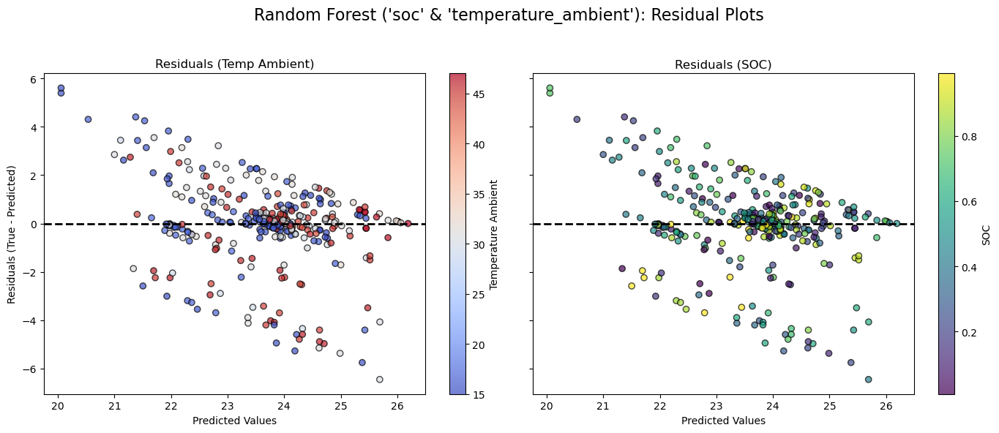

In [651]:
# Calculating residuals
residuals_rf = y_test - y_pred_rf_selected

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Residuals colored by temperature_ambient
sc1 = axes[0].scatter(y_pred_rf_selected, residuals_rf, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].axhline(0, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Residuals (Temp Ambient)')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals (True - Predicted)')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Residuals colored by SOC
sc2 = axes[1].scatter(y_pred_rf_selected, residuals_rf, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].axhline(0, color='black', linestyle='--', linewidth=2)
axes[1].set_title('Residuals (SOC)')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("Random Forest ('soc' & 'temperature_ambient'): Residual Plots", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### Droping Top 2 Features (SOC and temp) to Test Their Importance

#### Linear Regression (after dropping 'soc' and 'temperature_ambient')

In [652]:
# Droping top features
X_train_dropped = X_train.drop(columns=['soc', 'temperature_ambient'])
X_test_dropped = X_test.drop(columns=['soc', 'temperature_ambient'])

# Training Linear Regression
lr_model_dropped = LinearRegression()
lr_model_dropped.fit(X_train_dropped, y_train)

# Predicting and evaluating
y_pred_lr_dropped = lr_model_dropped.predict(X_test_dropped)
mse_lr_dropped = mean_squared_error(y_test, y_pred_lr_dropped)
rmse_lr_dropped = np.sqrt(mse_lr_dropped)
r2_lr_dropped = r2_score(y_test, y_pred_lr_dropped)

print("Linear Regression without 'soc' and 'temperature_ambient'")
print("RMSE:", rmse_lr_dropped)
print("R² Score:", r2_lr_dropped)


Linear Regression without 'soc' and 'temperature_ambient'
RMSE: 5.1777510992578994
R² Score: -7.6191170470816925


#### True vs Predicted Plots - Linear Regression (after dropping 'soc' and 'temperature_ambient')

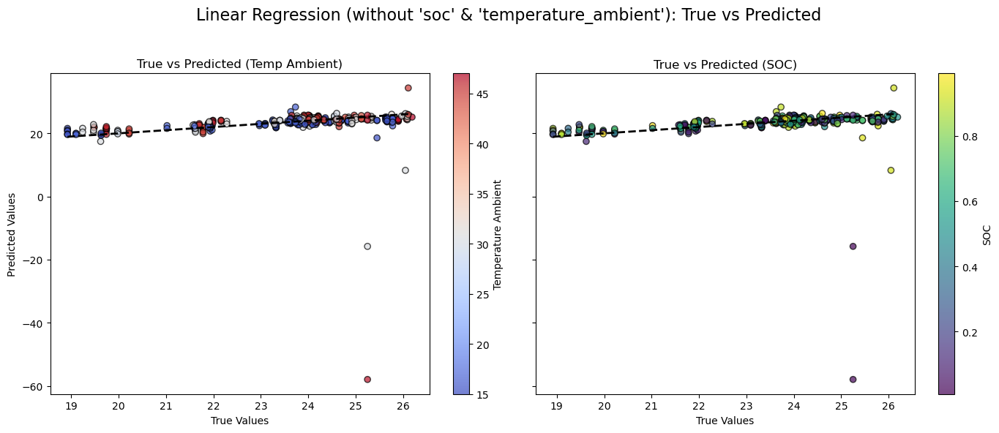

In [653]:
# Plot 
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Colored by temperature_ambient
sc1 = axes[0].scatter(y_test, y_pred_lr_dropped, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('True vs Predicted (Temp Ambient)')
axes[0].set_xlabel('True Values')
axes[0].set_ylabel('Predicted Values')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Colored by SOC
sc2 = axes[1].scatter(y_test, y_pred_lr_dropped, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1].set_title('True vs Predicted (SOC)')
axes[1].set_xlabel('True Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("Linear Regression (without 'soc' & 'temperature_ambient'): True vs Predicted", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Residual Plots - Linear Regression (after dropping 'soc' and 'temperature_ambient') 

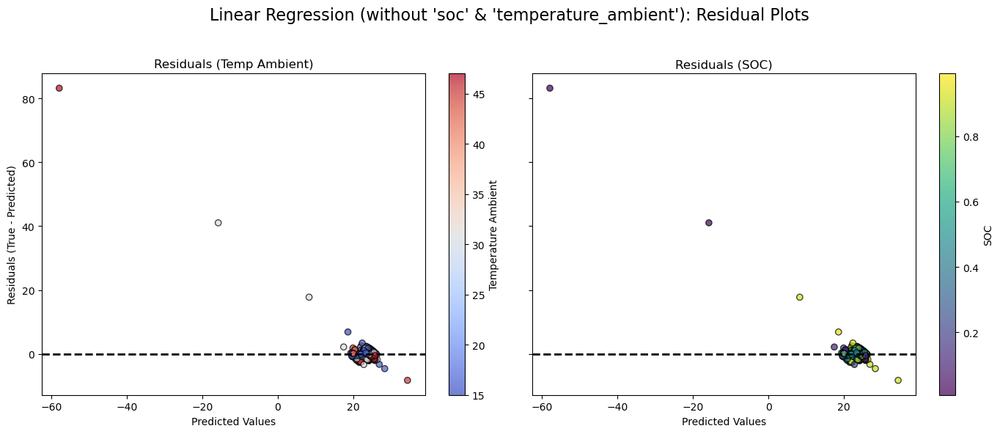

In [654]:
# Residual Plots 
residuals_lr_dropped = y_test - y_pred_lr_dropped

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Residuals colored by temperature_ambient
sc1 = axes[0].scatter(y_pred_lr_dropped, residuals_lr_dropped, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].axhline(0, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Residuals (Temp Ambient)')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals (True - Predicted)')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Residuals colored by SOC
sc2 = axes[1].scatter(y_pred_lr_dropped, residuals_lr_dropped, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].axhline(0, color='black', linestyle='--', linewidth=2)
axes[1].set_title('Residuals (SOC)')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("Linear Regression (without 'soc' & 'temperature_ambient'): Residual Plots", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Random Forest (after dropping 'soc' and 'temperature_ambient')

In [655]:
# Droping top features
X_train_dropped = X_train.drop(columns=['soc', 'temperature_ambient'])
X_test_dropped = X_test.drop(columns=['soc', 'temperature_ambient'])

# Retraining Random Forest model
rf_model_dropped = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_dropped.fit(X_train_dropped, y_train)

# Evaluating
y_pred_rf_dropped = rf_model_dropped.predict(X_test_dropped)
mse_rf_dropped = mean_squared_error(y_test, y_pred_rf_dropped)
rmse_rf_dropped = np.sqrt(mse_rf_dropped)
r2_rf_dropped = r2_score(y_test, y_pred_rf_dropped)

print("Random Forest without 'soc' and 'temperature_ambient'")
print("RMSE:", rmse_rf_dropped)
print("R² Score:", r2_rf_dropped)


Random Forest without 'soc' and 'temperature_ambient'
RMSE: 0.9282931813027927
R² Score: 0.7229547170455422


#### True vs Predicted Plots (Random Forest without 'soc' & 'temperature_ambient')


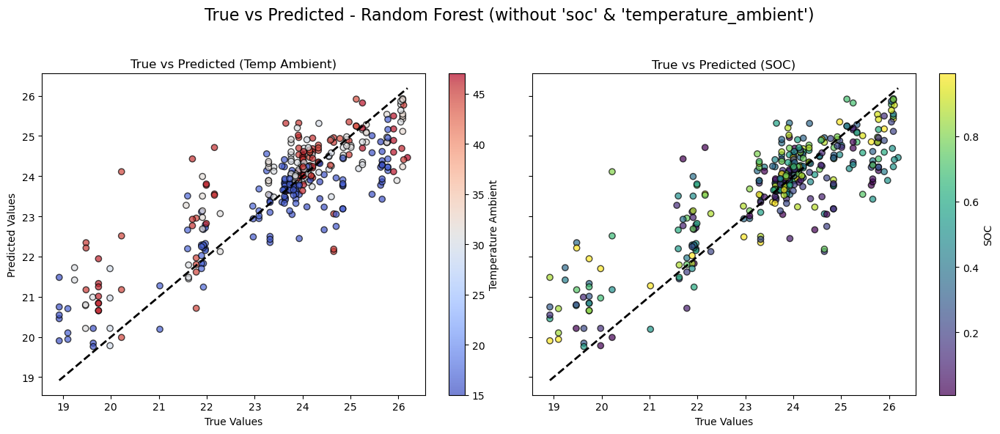

In [656]:

# Extracting features for coloring
temperature = X_test['temperature_ambient']
soc = X_test['soc']

# True vs Predicted Plots 
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Colored by temperature_ambient
sc1 = axes[0].scatter(y_test, y_pred_rf_dropped, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0].set_title('True vs Predicted (Temp Ambient)')
axes[0].set_xlabel('True Values')
axes[0].set_ylabel('Predicted Values')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Colored by SOC
sc2 = axes[1].scatter(y_test, y_pred_rf_dropped, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1].set_title('True vs Predicted (SOC)')
axes[1].set_xlabel('True Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("True vs Predicted - Random Forest (without 'soc' & 'temperature_ambient')", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Residual Plots (Random Forest without 'soc' & 'temperature_ambient')

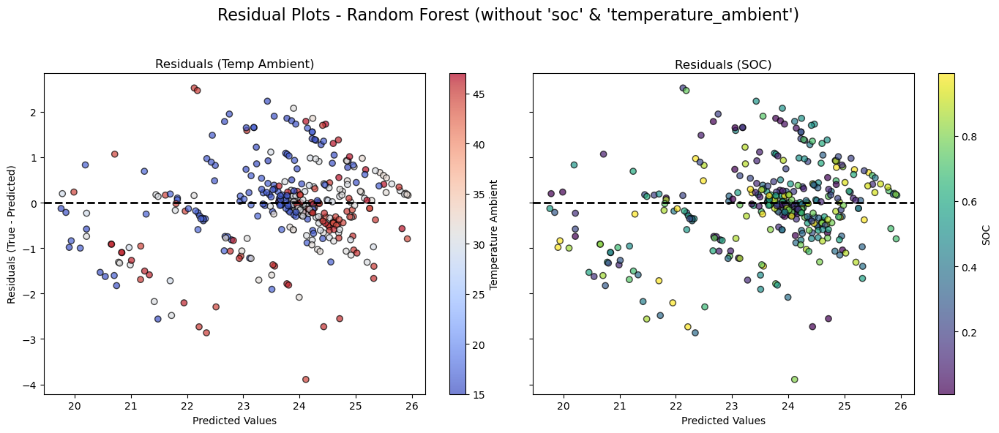

In [657]:
# Calculating residuals
residuals_rf_dropped = y_test - y_pred_rf_dropped

# Residual Plots 
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot 1: Residuals colored by temperature_ambient
sc1 = axes[0].scatter(y_pred_rf_dropped, residuals_rf_dropped, c=temperature, cmap='coolwarm', edgecolor='k', alpha=0.7)
axes[0].axhline(0, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Residuals (Temp Ambient)')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals (True - Predicted)')
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('Temperature Ambient')

# Plot 2: Residuals colored by SOC
sc2 = axes[1].scatter(y_pred_rf_dropped, residuals_rf_dropped, c=soc, cmap='viridis', edgecolor='k', alpha=0.7)
axes[1].axhline(0, color='black', linestyle='--', linewidth=2)
axes[1].set_title('Residuals (SOC)')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('')
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('SOC')

plt.suptitle("Residual Plots - Random Forest (without 'soc' & 'temperature_ambient')", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Plotting Test Error vs Training Error- Random Forest (without 'soc' & 'temperature_ambient')

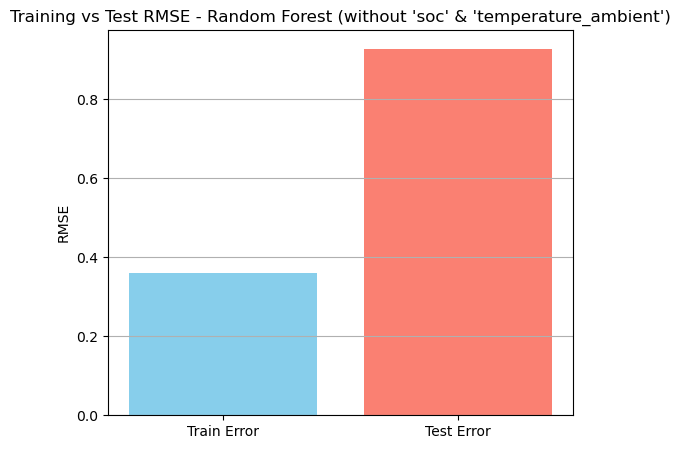

In [658]:
# Predicting on training and test sets
y_train_pred = rf_model_dropped.predict(X_train_dropped)
y_test_pred = rf_model_dropped.predict(X_test_dropped)

# Calculating RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

# Plot
plt.figure(figsize=(6, 5))
plt.bar(['Train Error', 'Test Error'], [rmse_train, rmse_test], color=['skyblue', 'salmon'])
plt.title("Training vs Test RMSE - Random Forest (without 'soc' & 'temperature_ambient')")
plt.ylabel("RMSE")
plt.grid(True, axis='y')
plt.show()


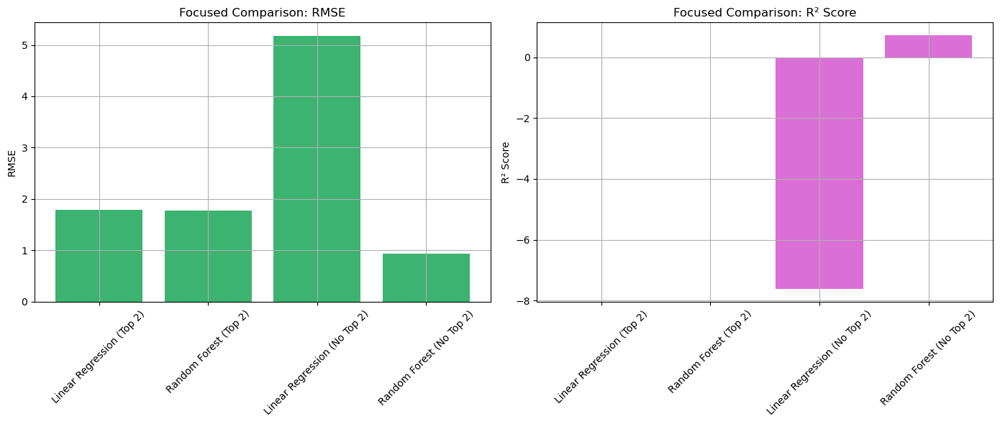

In [659]:
# Focused models
models_focus = ["Linear Regression (Top 2)", "Random Forest (Top 2)", "Linear Regression (No Top 2)","Random Forest (No Top 2)"]

rmse_focus = [1.784, 1.768, 5.178, 0.928]
r2_focus = [-0.023, -0.005, -7.619, 0.723]

# Creating side-by-side bar plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# RMSE plot
axes[0].bar(models_focus, rmse_focus, color='mediumseagreen')
axes[0].set_title("Focused Comparison: RMSE")
axes[0].set_ylabel("RMSE")
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True)

# R² plot
axes[1].bar(models_focus, r2_focus, color='orchid')
axes[1].set_title("Focused Comparison: R² Score")
axes[1].set_ylabel("R² Score")
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True)

plt.tight_layout()
plt.show()


#### Dummy Regressor

In [660]:
# Training Dummy Regressor (predicts the mean of y_train)
dummy = DummyRegressor(strategy='mean')
dummy.fit(X_train, y_train)

# Predictting on test set
y_pred_dummy = dummy.predict(X_test)

# Evaluating
mse_dummy = mean_squared_error(y_test, y_pred_dummy)
rmse_dummy = np.sqrt(mse_dummy)
r2_dummy = r2_score(y_test, y_pred_dummy)

print("Dummy Regressor (Mean Strategy)")
print("RMSE:", rmse_dummy)
print("R² Score:", r2_dummy)


Dummy Regressor (Mean Strategy)
RMSE: 1.7720646064975811
R² Score: -0.009577219308325224


### Dummy Regressor:True vs Predicted

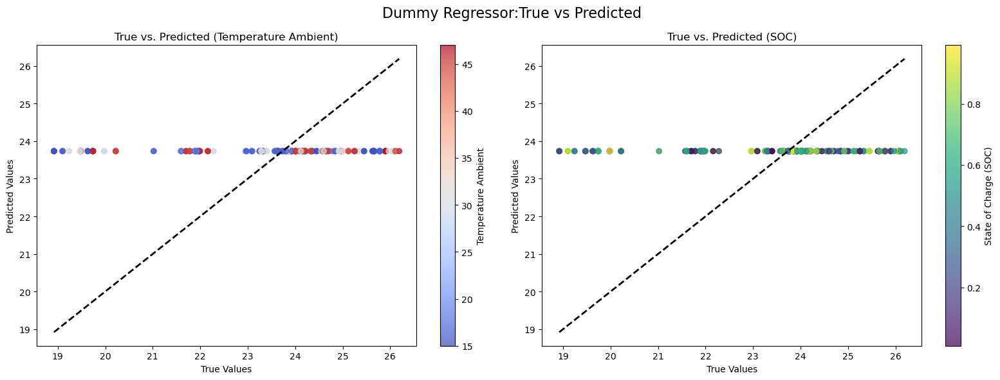

In [661]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Colored by temperature_ambient
sc1 = axes[0].scatter(plot_df['y_true'], plot_df['y_pred'], c=plot_df['temperature_ambient'], cmap='coolwarm', alpha=0.7)
axes[0].plot([plot_df['y_true'].min(), plot_df['y_true'].max()],
             [plot_df['y_true'].min(), plot_df['y_true'].max()],'k--', lw=2)
axes[0].set_title('True vs. Predicted (Temperature Ambient)')
axes[0].set_xlabel('True Values')
axes[0].set_ylabel('Predicted Values')
fig.colorbar(sc1, ax=axes[0], label='Temperature Ambient')

# Plot 2: Colored by soc
sc2 = axes[1].scatter(plot_df['y_true'], plot_df['y_pred'], c=plot_df['soc'], cmap='viridis', alpha=0.7)
axes[1].plot([plot_df['y_true'].min(), plot_df['y_true'].max()],
             [plot_df['y_true'].min(), plot_df['y_true'].max()],'k--', lw=2)
axes[1].set_title('True vs. Predicted (SOC)')
axes[1].set_xlabel('True Values')
axes[1].set_ylabel('Predicted Values')
fig.colorbar(sc2, ax=axes[1], label='State of Charge (SOC)')

plt.suptitle("Dummy Regressor:True vs Predicted", fontsize=16)
plt.tight_layout()
plt.show()


#### Dummy Regressor: Residual Plots

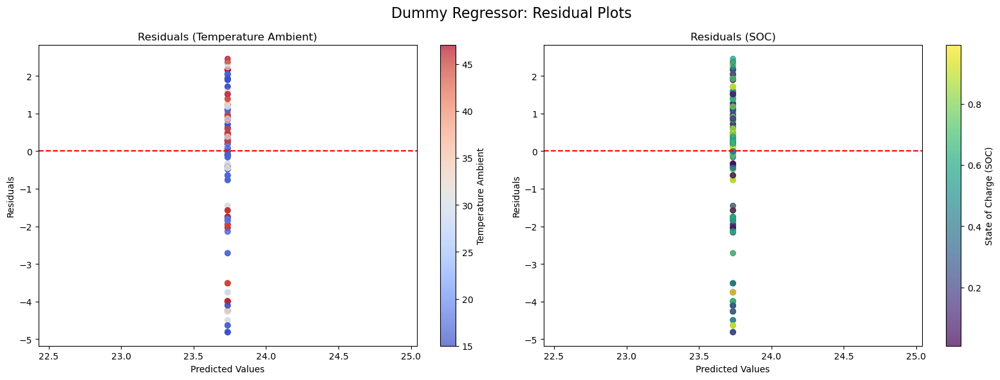

In [662]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Residuals colored by temperature_ambient
sc1 = axes[0].scatter(plot_df['y_pred'], plot_df['residual'], c=plot_df['temperature_ambient'], cmap='coolwarm', alpha=0.7)
axes[0].axhline(0, color='red', linestyle='--')
axes[0].set_title('Residuals (Temperature Ambient)')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals')
fig.colorbar(sc1, ax=axes[0], label='Temperature Ambient')

# Plot 2: Residuals colored by soc
sc2 = axes[1].scatter(plot_df['y_pred'], plot_df['residual'], c=plot_df['soc'], cmap='viridis', alpha=0.7)
axes[1].axhline(0, color='red', linestyle='--')
axes[1].set_title('Residuals (SOC)')
axes[1].set_xlabel('Predicted Values')
axes[1].set_ylabel('Residuals')
fig.colorbar(sc2, ax=axes[1], label='State of Charge (SOC)')

plt.suptitle("Dummy Regressor: Residual Plots", fontsize=16)
plt.tight_layout()
plt.show()


### Bar plots comparing the models (one for RMSE and one for R² Score)

##### Random Forest vs Dummy Regressor

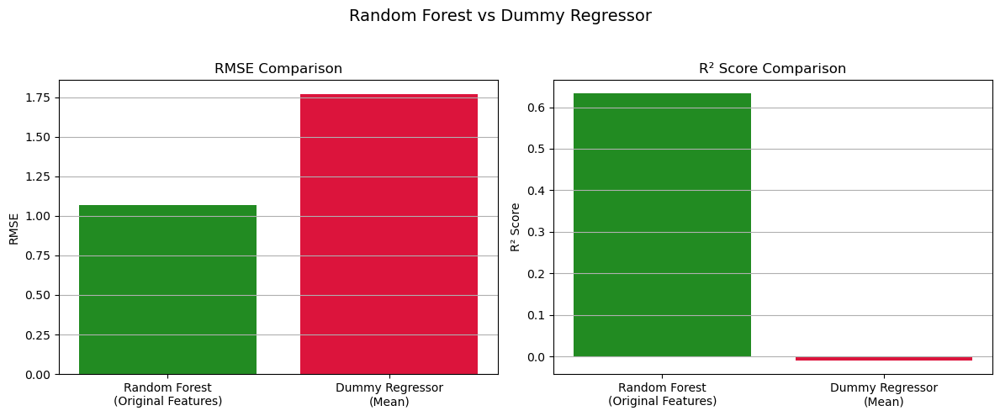

In [663]:
# Model names and values
models = ['Random Forest\n(Original Features)', 'Dummy Regressor\n(Mean)']
rmse_values = [1.07, 1.77]
r2_values = [0.633, -0.01]

# Seting up the figure
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# RMSE plot
axes[0].bar(models, rmse_values, color=['forestgreen', 'crimson'])
axes[0].set_title('RMSE Comparison')
axes[0].set_ylabel('RMSE')
axes[0].grid(True, axis='y')

# R² plot
axes[1].bar(models, r2_values, color=['forestgreen', 'crimson'])
axes[1].set_title('R² Score Comparison')
axes[1].set_ylabel('R² Score')
axes[1].grid(True, axis='y')

plt.suptitle('Random Forest vs Dummy Regressor', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Random Forest vs Linear Regression (PCA) vs Dummy Regressor

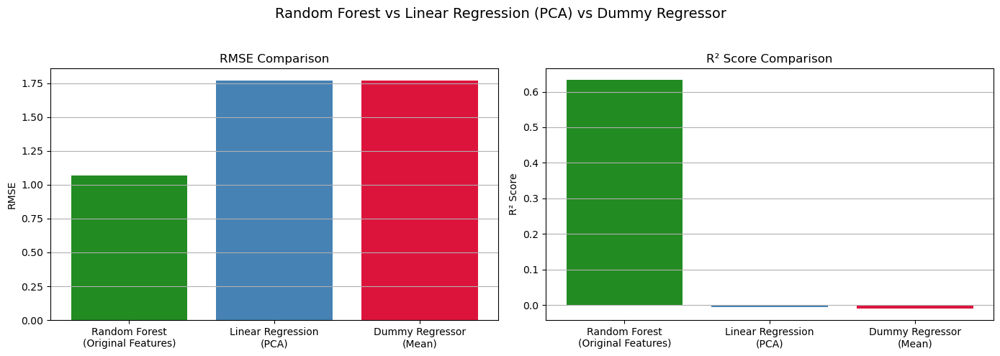

In [664]:
# Model names and values
models = ['Random Forest\n(Original Features)', 'Linear Regression\n(PCA)', 'Dummy Regressor\n(Mean)']
rmse_values = [1.07, 1.77, 1.77]
r2_values = [0.633, -0.006, -0.01]

# Setting up the figure
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# RMSE plot
axes[0].bar(models, rmse_values, color=['forestgreen', 'steelblue', 'crimson'])
axes[0].set_title('RMSE Comparison')
axes[0].set_ylabel('RMSE')
axes[0].grid(True, axis='y')

# R² plot
axes[1].bar(models, r2_values, color=['forestgreen', 'steelblue', 'crimson'])
axes[1].set_title('R² Score Comparison')
axes[1].set_ylabel('R² Score')
axes[1].grid(True, axis='y')

plt.suptitle('Random Forest vs Linear Regression (PCA) vs Dummy Regressor', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Random Forest vs Linear Regression (PCA) vs Linear Regression (soc & temp) vs  Dummy Regressor

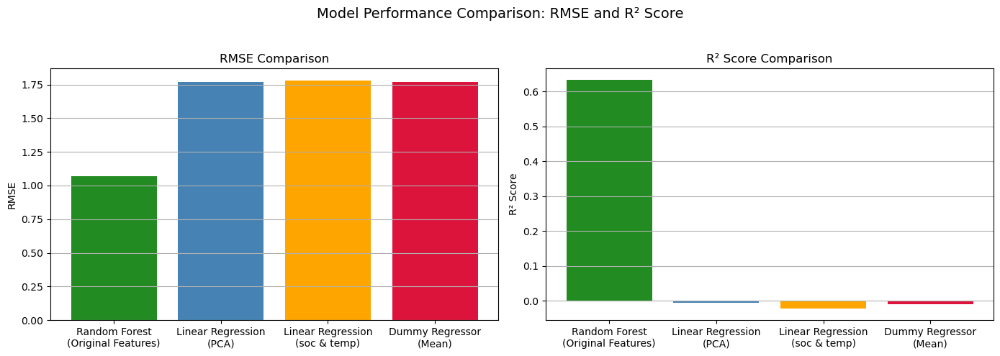

In [665]:
# model names 
models = ['Random Forest\n(Original Features)','Linear Regression\n(PCA)','Linear Regression\n(soc & temp)','Dummy Regressor\n(Mean)']

# RMSE and R² values
rmse_values = [1.07, 1.77, 1.78, 1.77]
r2_values = [0.633, -0.006, -0.023, -0.01]

# Setting up the figure and axes
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar plot for RMSE
axes[0].bar(models, rmse_values, color=['forestgreen', 'steelblue', 'orange', 'crimson'])
axes[0].set_title('RMSE Comparison')
axes[0].set_ylabel('RMSE')
axes[0].grid(True, axis='y')

# Bar plot for R² Score
axes[1].bar(models, r2_values, color=['forestgreen', 'steelblue', 'orange', 'crimson'])
axes[1].set_title('R² Score Comparison')
axes[1].set_ylabel('R² Score')
axes[1].grid(True, axis='y')

# Layout
plt.suptitle('Model Performance Comparison: RMSE and R² Score', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Random Forest vs Linear Regression (PCA) vs Linear Regression (soc & temp) vs Linear Regression (all features) vs Dummy Regressor

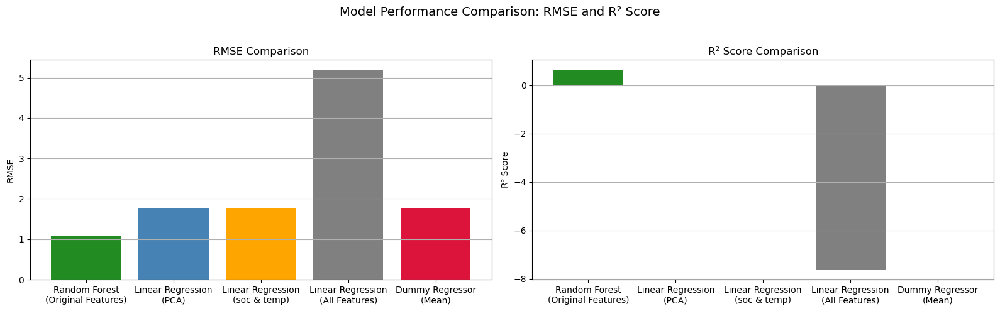

In [666]:
# model names
models = ['Random Forest\n(Original Features)','Linear Regression\n(PCA)','Linear Regression\n(soc & temp)','Linear Regression\n(All Features)',
          'Dummy Regressor\n(Mean)']

# RMSE and R² values
rmse_values = [1.07, 1.77, 1.78, 5.18, 1.77]
r2_values = [0.633, -0.006, -0.023, -7.62, -0.01]

# Setting up the figure and axes
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Bar plot for RMSE
axes[0].bar(models, rmse_values, color=['forestgreen', 'steelblue', 'orange', 'gray', 'crimson'])
axes[0].set_title('RMSE Comparison')
axes[0].set_ylabel('RMSE')
axes[0].grid(True, axis='y')

# Bar plot for R² Score
axes[1].bar(models, r2_values, color=['forestgreen', 'steelblue', 'orange', 'gray', 'crimson'])
axes[1].set_title('R² Score Comparison')
axes[1].set_ylabel('R² Score')
axes[1].grid(True, axis='y')

# Layout
plt.suptitle('Model Performance Comparison: RMSE and R² Score', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


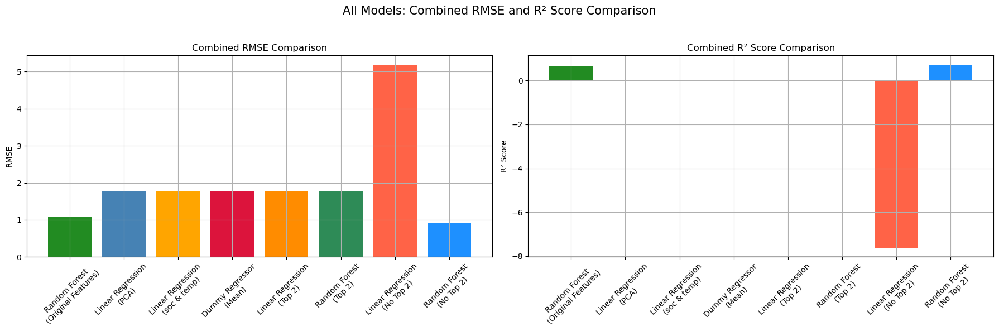

In [667]:
# Combined model names
models_combined = ['Random Forest\n(Original Features)',
                   'Linear Regression\n(PCA)',
                   'Linear Regression\n(soc & temp)',
                   'Dummy Regressor\n(Mean)',
                   'Linear Regression\n(Top 2)',
                   'Random Forest\n(Top 2)',
                   'Linear Regression\n(No Top 2)',
                   'Random Forest\n(No Top 2)']

# Corresponding RMSE and R² values
rmse_combined = [1.07, 1.77, 1.78, 1.77, 1.784, 1.768, 5.178, 0.928]
r2_combined = [0.633, -0.006, -0.023, -0.01, -0.023, -0.005, -7.619, 0.723]

# Giving unique colors for each bar
colors_combined = ['forestgreen', 'steelblue', 'orange', 'crimson','darkorange', 'seagreen', 'tomato', 'dodgerblue']

# Creating side-by-side bar plots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# RMSE plot
axes[0].bar(models_combined, rmse_combined, color=colors_combined)
axes[0].set_title("Combined RMSE Comparison")
axes[0].set_ylabel("RMSE")
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True)

# R² plot
axes[1].bar(models_combined, r2_combined, color=colors_combined)
axes[1].set_title("Combined R² Score Comparison")
axes[1].set_ylabel("R² Score")
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(True)

# Overall layout
plt.suptitle("All Models: Combined RMSE and R² Score Comparison", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### Side-by-Side Comparison: Training vs Test RMSE (Original vs Dropped Features) - Random Forest model

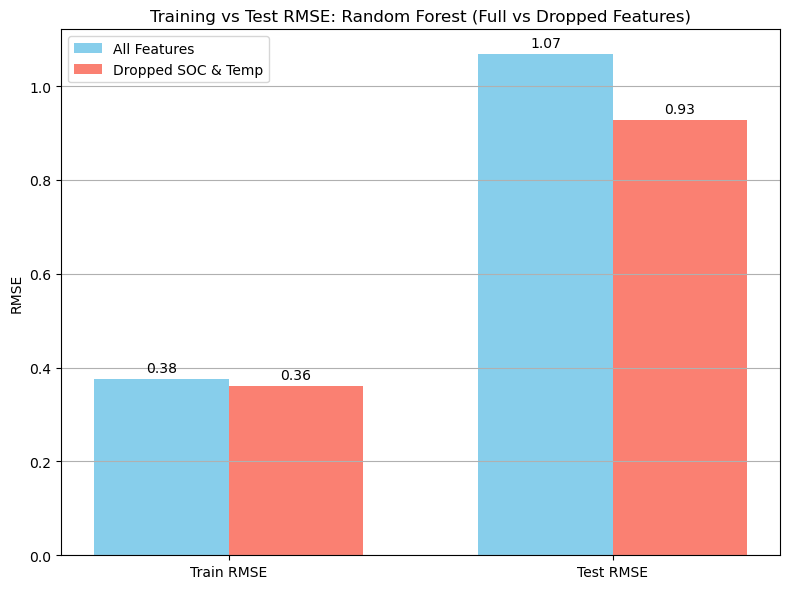

In [668]:
# Model 1: Random Forest with all features 
rf_model_full = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_full.fit(X_train, y_train)

y_train_pred_full = rf_model_full.predict(X_train)
y_test_pred_full = rf_model_full.predict(X_test)

rmse_train_full = np.sqrt(mean_squared_error(y_train, y_train_pred_full))
rmse_test_full = np.sqrt(mean_squared_error(y_test, y_test_pred_full))

# Model 2: Random Forest without 'soc' and 'temperature_ambient' 
rf_model_dropped = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_dropped.fit(X_train_dropped, y_train)

y_train_pred_dropped = rf_model_dropped.predict(X_train_dropped)
y_test_pred_dropped = rf_model_dropped.predict(X_test_dropped)

rmse_train_dropped = np.sqrt(mean_squared_error(y_train, y_train_pred_dropped))
rmse_test_dropped = np.sqrt(mean_squared_error(y_test, y_test_pred_dropped))

# Plotting 
labels = ['Train RMSE', 'Test RMSE']
full_model_errors = [rmse_train_full, rmse_test_full]
dropped_model_errors = [rmse_train_dropped, rmse_test_dropped]

x = np.arange(len(labels))  # [0, 1]
width = 0.35

fig, ax = plt.subplots(figsize=(8, 6))
bars1 = ax.bar(x - width/2, full_model_errors, width, label='All Features', color='skyblue')
bars2 = ax.bar(x + width/2, dropped_model_errors, width, label='Dropped SOC & Temp', color='salmon')

# Labels and formatting
ax.set_ylabel('RMSE')
ax.set_title('Training vs Test RMSE: Random Forest (Full vs Dropped Features)')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
ax.grid(True, axis='y')

# Annotating bars with values
for bar in bars1 + bars2:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height), xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

plt.tight_layout()
plt.show()


#### SHAP analysis 

In [669]:
# pip install shap

####  SHAP for Linear Regression  (Without 'soc' & 'temperature_ambient')

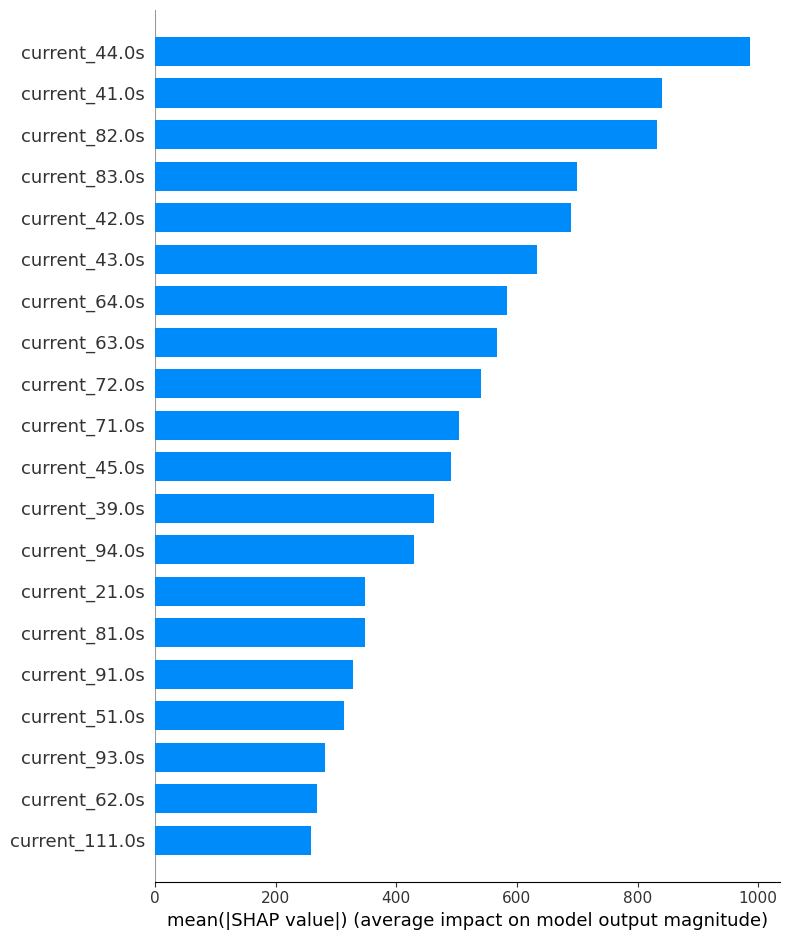

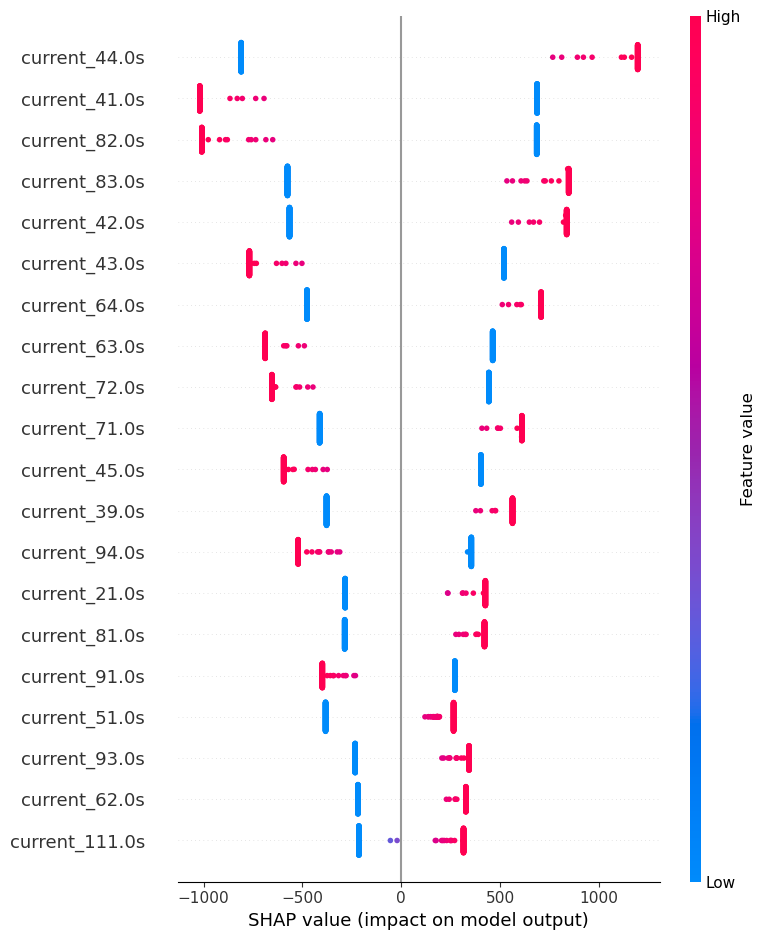

In [670]:
import shap

# Creating SHAP explainer for linear model
explainer = shap.Explainer(lr_model_dropped, X_train_dropped)
shap_values = explainer(X_test_dropped)

# Summary plot
shap.summary_plot(shap_values, X_test_dropped, plot_type="bar")

# Detailed plot
shap.summary_plot(shap_values, X_test_dropped)


####  SHAP for Linear Regression 'soc' and 'temperature_ambient'

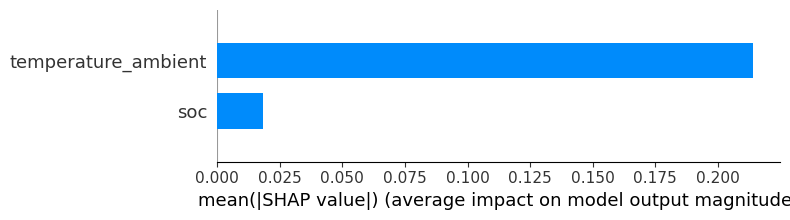

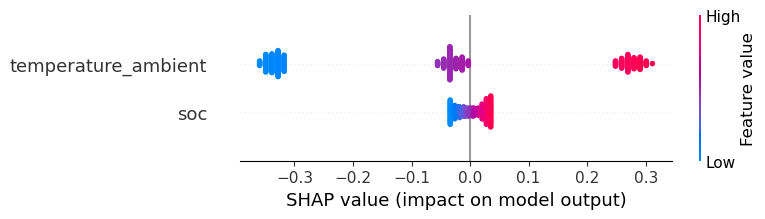

In [671]:
import shap

# Creating SHAP explainer
explainer_selected = shap.Explainer(lr_model_selected, X_train_selected)

# Computing SHAP values for test set
shap_values_selected = explainer_selected(X_test_selected)

# Summary plot (bar)
shap.summary_plot(shap_values_selected, X_test_selected, plot_type="bar")

# Summary plot (detailed)
shap.summary_plot(shap_values_selected, X_test_selected)


#### SHAP for Random Forest (Without 'soc' & 'temperature_ambient')

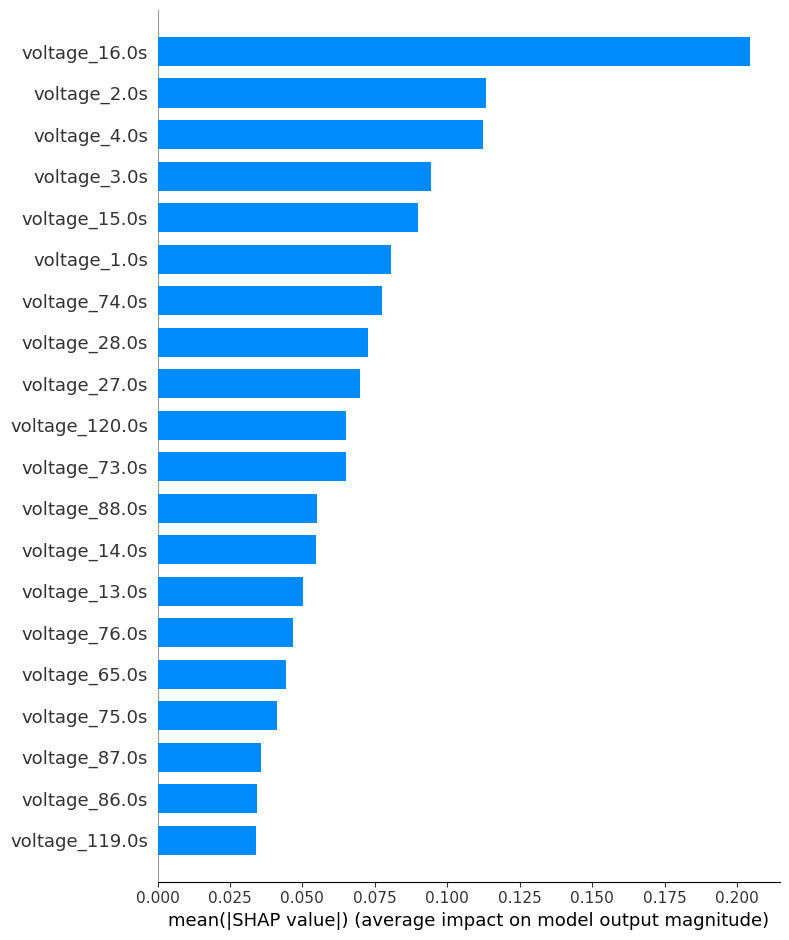

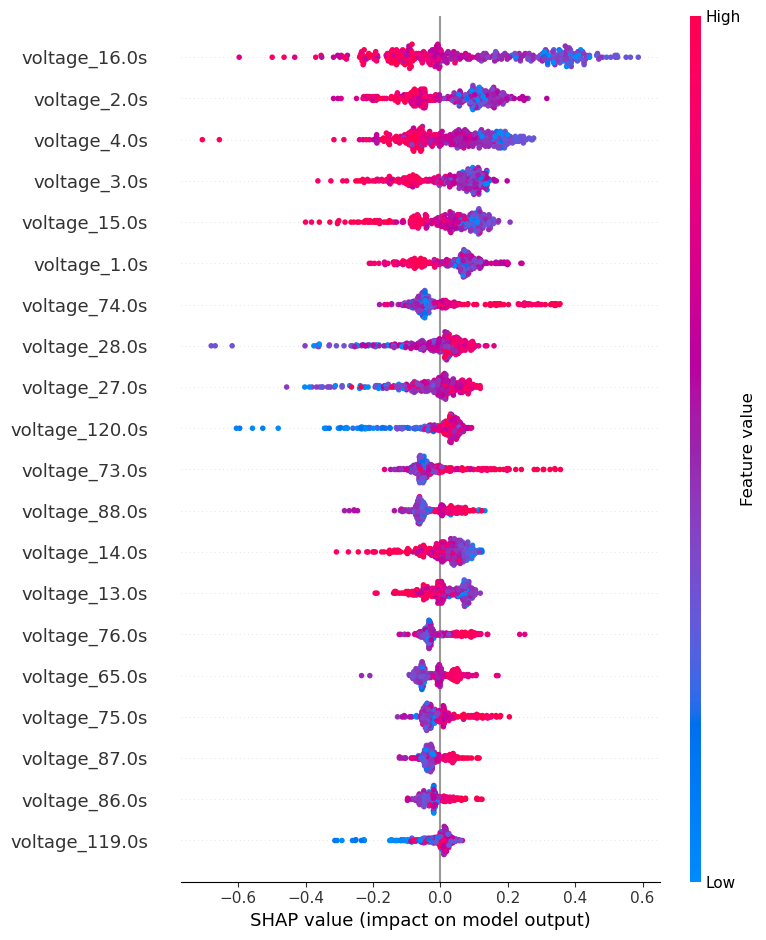

In [672]:
import shap

# Creating SHAP explainer for Random Forest
explainer = shap.TreeExplainer(rf_model_dropped)  
shap_values = explainer.shap_values(X_test_dropped)

# Summary plot - bar
shap.summary_plot(shap_values, X_test_dropped, plot_type="bar")

# Detailed summary plot 
shap.summary_plot(shap_values, X_test_dropped)


#### SHAP for Random Forest (all the features)

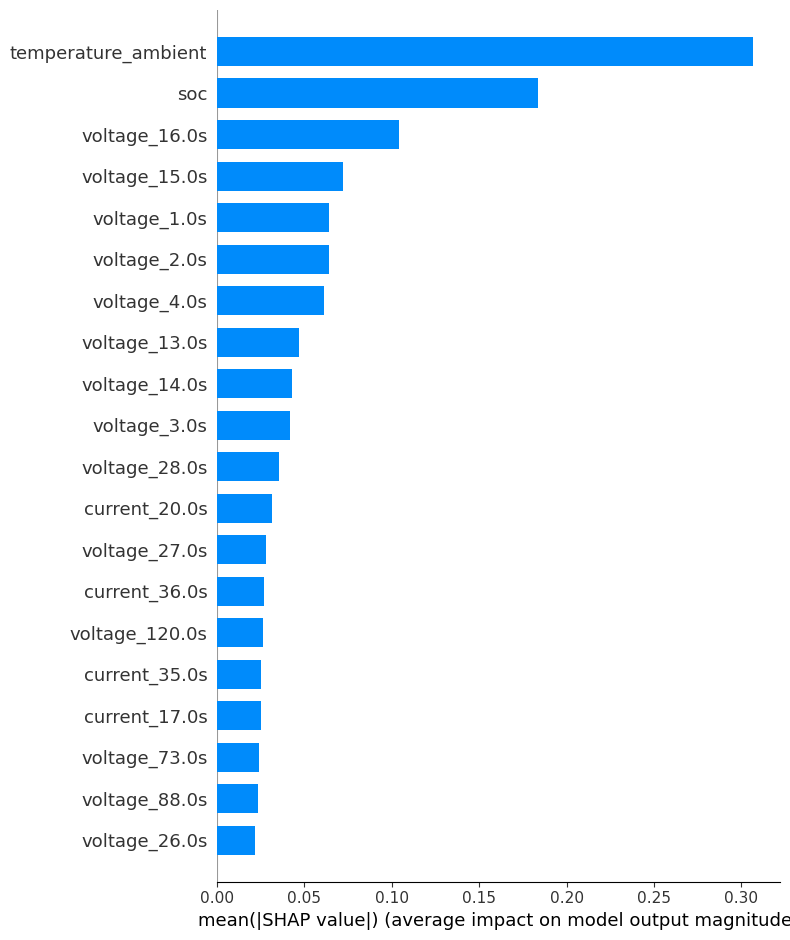

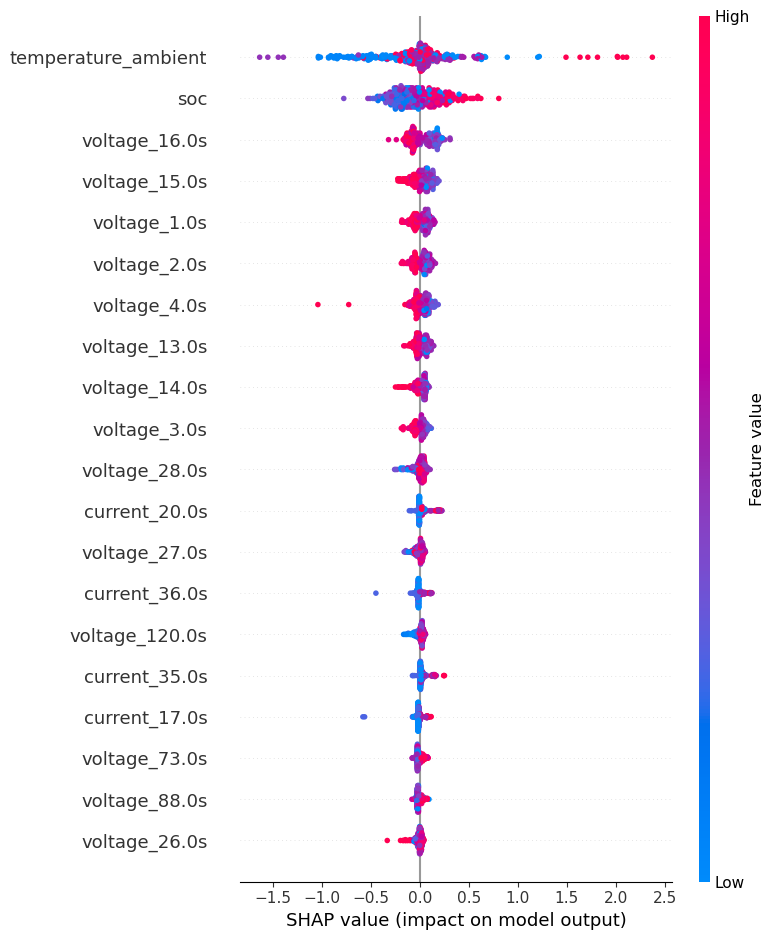

In [673]:
# Creating SHAP explainer for Random Forest
explainer = shap.TreeExplainer(rf_model)  
shap_values = explainer.shap_values(X_test)

# Summary plot (bar)
shap.summary_plot(shap_values, X_test, plot_type="bar")

# Detailed summary plot 
shap.summary_plot(shap_values, X_test)
